# ML
### 1- SML
### 2- USNL
### 3- Semi SML

____________________________________________________________________
### Training and ML and Sklearn
lib.model.class

1- import needed class
2- customizing your model
3- use your model for training
4- predict 
5- evaluation
-------------------------------------------------------
### Lib
Numpy : math
Pandas : data processing
matplotlib, seaborn : graph 
tensorflow, keras, : DL
sklearn : training
openssl : image processing
scipy : optimization
-------------------------------------------------------
### 1- SML
deal with labeled data "have o/p"
#### a- regression
#### b- classification


Reading
data reshaping
Cleaning : nulls, invalid values
Outliers
FE
FS
Visualizations
Models
Evaluation




it doesn`t matter what you know, it matters what you are able to know when you need it


#### a- regression
for predecting numerical values
![Screenshot from 2024-05-29 18-22-25.png](<attachment:Screenshot from 2024-05-29 18-22-25.png>)

    a.1- building your equation
    a.2- Randomized your weights
        a.2.1 calculating output "using current weight" for every row
        a.2.2 calculate cost function for every row
                                        MSE : Mean squared error
                                        MAE : Mean absolute error
        a.2.3 use GD to update thetas for every row : Graddient Descent "Optimization"
        
![Screenshot from 2024-05-29 18-54-49.png](<attachment:Screenshot from 2024-05-29 18-54-49.png>)
![Screenshot from 2024-05-29 19-37-33.png](<attachment:Screenshot from 2024-05-29 19-37-33.png>)

##### Evaluation
- metrics for evaluation the ML model 
- it is most important stage and it is the most complicated stage in ML
- we must search for the best tool for evaluation
- in regression, there is no measure for accuracy but the accuracy is considered one of the tecniques of evaluation
- selecting the suitable technique for the proper model like "MSE, MAE,...etc" 



##### Notations
1- there are a lot of mathmatical equation in ML, DL Neural network like linear regression, ...etc. 
    but totally all of them have the same concept like gradient descent, cost function, weights
2- the mathmatical eq is the relationship between feature and output but the model is the total steps to get the optimal solution
3- sklearn have a lot of models for regression and my role is selcting the proper model for the issue
4- the model can be measured by accuracy, processing time, Ram consumption

In [61]:
import pandas as pd

data = pd.read_csv('Airline Delay.csv')
data.head()


,year,month,carrier,carrier_name,airport,airport_name,arr_flights,arr_del15,carrier_ct,weather_ct,...,security_ct,late_aircraft_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
0,2020,12,9E,Endeavor Air Inc.,ABE,"Allentown/Bethlehem/Easton, PA: Lehigh Valley ...",44.0,3.0,1.63,0.0,...,0.0,1.25,0.0,1.0,89.0,56.0,0.0,3.0,0.0,30.0
1,2020,12,9E,Endeavor Air Inc.,ABY,"Albany, GA: Southwest Georgia Regional",90.0,1.0,0.96,0.0,...,0.0,0.00,0.0,0.0,23.0,22.0,0.0,1.0,0.0,0.0
2,2020,12,9E,Endeavor Air Inc.,AEX,"Alexandria, LA: Alexandria International",88.0,8.0,5.75,0.0,...,0.0,0.65,0.0,1.0,338.0,265.0,0.0,45.0,0.0,28.0
3,2020,12,9E,Endeavor Air Inc.,AGS,"Augusta, GA: Augusta Regional at Bush Field",184.0,9.0,4.17,0.0,...,0.0,3.00,0.0,0.0,508.0,192.0,0.0,92.0,0.0,224.0
4,2020,12,9E,Endeavor Air Inc.,ALB,"Albany, NY: Albany International",76.0,11.0,4.78,0.0,...,0.0,1.00,1.0,0.0,692.0,398.0,0.0,178.0,0.0,116.0


there are some steps will be agnored currently like data processing and feature extraction cause will be handled later

In [62]:
data.isna().sum()

year                   0
month                  0
carrier                0
carrier_name           0
airport                0
airport_name           0
arr_flights            8
arr_del15              8
carrier_ct             8
weather_ct             8
nas_ct                 8
security_ct            8
late_aircraft_ct       8
arr_cancelled          8
arr_diverted           8
arr_delay              8
carrier_delay          8
weather_delay          8
nas_delay              8
security_delay         8
late_aircraft_delay    8
dtype: int64

In [63]:
data.dropna(inplace=True)
data.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 3343 entries, 0 to 3350
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   year                 3343 non-null   int64  
 1   month                3343 non-null   int64  
 2   carrier              3343 non-null   object 
 3   carrier_name         3343 non-null   object 
 4   airport              3343 non-null   object 
 5   airport_name         3343 non-null   object 
 6   arr_flights          3343 non-null   float64
 7   arr_del15            3343 non-null   float64
 8   carrier_ct           3343 non-null   float64
 9   weather_ct           3343 non-null   float64
 10  nas_ct               3343 non-null   float64
 11  security_ct          3343 non-null   float64
 12  late_aircraft_ct     3343 non-null   float64
 13  arr_cancelled        3343 non-null   float64
 14  arr_diverted         3343 non-null   float64
 15  arr_delay            3343 non-null   f

In [64]:
data.drop(['carrier','carrier_name','airport','airport_name'],axis=1,inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3343 entries, 0 to 3350
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   year                 3343 non-null   int64  
 1   month                3343 non-null   int64  
 2   arr_flights          3343 non-null   float64
 3   arr_del15            3343 non-null   float64
 4   carrier_ct           3343 non-null   float64
 5   weather_ct           3343 non-null   float64
 6   nas_ct               3343 non-null   float64
 7   security_ct          3343 non-null   float64
 8   late_aircraft_ct     3343 non-null   float64
 9   arr_cancelled        3343 non-null   float64
 10  arr_diverted         3343 non-null   float64
 11  arr_delay            3343 non-null   float64
 12  carrier_delay        3343 non-null   float64
 13  weather_delay        3343 non-null   float64
 14  nas_delay            3343 non-null   float64
 15  security_delay       3343 non-null   f

In [65]:
data

,year,month,arr_flights,arr_del15,carrier_ct,weather_ct,nas_ct,security_ct,late_aircraft_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
0,2020,12,44.0,3.0,1.63,0.00,0.12,0.0,1.25,0.0,1.0,89.0,56.0,0.0,3.0,0.0,30.0
1,2020,12,90.0,1.0,0.96,0.00,0.04,0.0,0.00,0.0,0.0,23.0,22.0,0.0,1.0,0.0,0.0
2,2020,12,88.0,8.0,5.75,0.00,1.60,0.0,0.65,0.0,1.0,338.0,265.0,0.0,45.0,0.0,28.0
3,2020,12,184.0,9.0,4.17,0.00,1.83,0.0,3.00,0.0,0.0,508.0,192.0,0.0,92.0,0.0,224.0
4,2020,12,76.0,11.0,4.78,0.00,5.22,0.0,1.00,1.0,0.0,692.0,398.0,0.0,178.0,0.0,116.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3346,2019,12,56.0,8.0,2.20,1.00,3.99,0.0,0.80,0.0,1.0,353.0,165.0,19.0,135.0,0.0,34.0
3347,2019,12,76.0,17.0,7.51,0.24,4.13,0.0,5.12,0.0,0.0,1880.0,1516.0,25.0,200.0,0.0,139.0
3348,2019,12,7.0,1.0,0.00,0.48,0.52,0.0,0.00,0.0,0.0,96.0,0.0,46.0,50.0,0.0,0.0
3349,2019,12,12.0,1.0,0.00,0.00,1.00,0.0,0.00,0.0,0.0,23.0,0.0,0.0,23.0,0.0,0.0


In [66]:
X = data.drop(['late_aircraft_ct'],axis=1,inplace=False)
y = data['late_aircraft_ct']
data.head()

#overWrite


,year,month,arr_flights,arr_del15,carrier_ct,weather_ct,nas_ct,security_ct,late_aircraft_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
0,2020,12,44.0,3.0,1.63,0.0,0.12,0.0,1.25,0.0,1.0,89.0,56.0,0.0,3.0,0.0,30.0
1,2020,12,90.0,1.0,0.96,0.0,0.04,0.0,0.00,0.0,0.0,23.0,22.0,0.0,1.0,0.0,0.0
2,2020,12,88.0,8.0,5.75,0.0,1.60,0.0,0.65,0.0,1.0,338.0,265.0,0.0,45.0,0.0,28.0
3,2020,12,184.0,9.0,4.17,0.0,1.83,0.0,3.00,0.0,0.0,508.0,192.0,0.0,92.0,0.0,224.0
4,2020,12,76.0,11.0,4.78,0.0,5.22,0.0,1.00,1.0,0.0,692.0,398.0,0.0,178.0,0.0,116.0


In [67]:
X.head()

,year,month,arr_flights,arr_del15,carrier_ct,weather_ct,nas_ct,security_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
0,2020,12,44.0,3.0,1.63,0.0,0.12,0.0,0.0,1.0,89.0,56.0,0.0,3.0,0.0,30.0
1,2020,12,90.0,1.0,0.96,0.0,0.04,0.0,0.0,0.0,23.0,22.0,0.0,1.0,0.0,0.0
2,2020,12,88.0,8.0,5.75,0.0,1.60,0.0,0.0,1.0,338.0,265.0,0.0,45.0,0.0,28.0
3,2020,12,184.0,9.0,4.17,0.0,1.83,0.0,0.0,0.0,508.0,192.0,0.0,92.0,0.0,224.0
4,2020,12,76.0,11.0,4.78,0.0,5.22,0.0,1.0,0.0,692.0,398.0,0.0,178.0,0.0,116.0


In [68]:
y


0       1.25
1       0.00
2       0.65
3       3.00
4       1.00
        ... 
3346    0.80
3347    5.12
3348    0.00
3349    0.00
3350    0.00
Name: late_aircraft_ct, Length: 3343, dtype: float64

In [69]:
X


,year,month,arr_flights,arr_del15,carrier_ct,weather_ct,nas_ct,security_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
0,2020,12,44.0,3.0,1.63,0.00,0.12,0.0,0.0,1.0,89.0,56.0,0.0,3.0,0.0,30.0
1,2020,12,90.0,1.0,0.96,0.00,0.04,0.0,0.0,0.0,23.0,22.0,0.0,1.0,0.0,0.0
2,2020,12,88.0,8.0,5.75,0.00,1.60,0.0,0.0,1.0,338.0,265.0,0.0,45.0,0.0,28.0
3,2020,12,184.0,9.0,4.17,0.00,1.83,0.0,0.0,0.0,508.0,192.0,0.0,92.0,0.0,224.0
4,2020,12,76.0,11.0,4.78,0.00,5.22,0.0,1.0,0.0,692.0,398.0,0.0,178.0,0.0,116.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3346,2019,12,56.0,8.0,2.20,1.00,3.99,0.0,0.0,1.0,353.0,165.0,19.0,135.0,0.0,34.0
3347,2019,12,76.0,17.0,7.51,0.24,4.13,0.0,0.0,0.0,1880.0,1516.0,25.0,200.0,0.0,139.0
3348,2019,12,7.0,1.0,0.00,0.48,0.52,0.0,0.0,0.0,96.0,0.0,46.0,50.0,0.0,0.0
3349,2019,12,12.0,1.0,0.00,0.00,1.00,0.0,0.0,0.0,23.0,0.0,0.0,23.0,0.0,0.0


In [70]:
data

,year,month,arr_flights,arr_del15,carrier_ct,weather_ct,nas_ct,security_ct,late_aircraft_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
0,2020,12,44.0,3.0,1.63,0.00,0.12,0.0,1.25,0.0,1.0,89.0,56.0,0.0,3.0,0.0,30.0
1,2020,12,90.0,1.0,0.96,0.00,0.04,0.0,0.00,0.0,0.0,23.0,22.0,0.0,1.0,0.0,0.0
2,2020,12,88.0,8.0,5.75,0.00,1.60,0.0,0.65,0.0,1.0,338.0,265.0,0.0,45.0,0.0,28.0
3,2020,12,184.0,9.0,4.17,0.00,1.83,0.0,3.00,0.0,0.0,508.0,192.0,0.0,92.0,0.0,224.0
4,2020,12,76.0,11.0,4.78,0.00,5.22,0.0,1.00,1.0,0.0,692.0,398.0,0.0,178.0,0.0,116.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3346,2019,12,56.0,8.0,2.20,1.00,3.99,0.0,0.80,0.0,1.0,353.0,165.0,19.0,135.0,0.0,34.0
3347,2019,12,76.0,17.0,7.51,0.24,4.13,0.0,5.12,0.0,0.0,1880.0,1516.0,25.0,200.0,0.0,139.0
3348,2019,12,7.0,1.0,0.00,0.48,0.52,0.0,0.00,0.0,0.0,96.0,0.0,46.0,50.0,0.0,0.0
3349,2019,12,12.0,1.0,0.00,0.00,1.00,0.0,0.00,0.0,0.0,23.0,0.0,0.0,23.0,0.0,0.0


![Screenshot from 2024-05-31 11-44-04.png](<attachment:Screenshot from 2024-05-31 11-44-04.png>) ![Screenshot from 2024-05-31 11-44-18.png](<attachment:Screenshot from 2024-05-31 11-44-18.png>)

WINEPREFIX=~/.wine wine /home/ahmed-ferganey/.wine/drive_c/MLHelper/ML_Helper_1.21/MLHelper.exe


In [71]:
X.shape


(3343, 16)

In [72]:
y.shape

(3343,)

In [73]:
#----------------------------------------------------
# Import Libraries
#----------------------------------------------------
#Splitting data
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=44, shuffle =True)

#Splitted Data
print('X_train shape is ' , X_train.shape)
print('X_test shape is ' , X_test.shape)
print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)

X_train shape is  (2507, 16)
X_test shape is  (836, 16)
y_train shape is  (2507,)
y_test shape is  (836,)


- to be noted that the percentage of training is 70 to 80 %and testing 20 to 30 %
- the cocept behind the percentage that if we train the model on 95% we will only test the accuracy of the model on only 5% so perhaps the result will not be  accurate
- it is important that the data will be shfulled cause imagine having data for the real state and it is ordered according to their location so the data on the last rows will be X-test and there is no sample for this lcoation as X-train



In [74]:
    # linear regression
# Import Libraries
from sklearn.linear_model import LinearRegression
#----------------------------------------------------

#----------------------------------------------------
#Applying Linear Regression Model 

LinearRegressionModel = LinearRegression(fit_intercept=True, normalize=True,copy_X=True,n_jobs=-1)



In [75]:
%%time
LinearRegressionModel.fit(X_train, y_train)
# y = t1x1 + t2x2 + .... + t16x16
# y = 0.98x1 + 0.07x2 + .... + 0.87x16


CPU times: user 5.07 ms, sys: 25 µs, total: 5.1 ms
Wall time: 3.77 ms


/home/ahmed-ferganey/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(


LinearRegression(n_jobs=-1, normalize=True)

In [76]:
X_train.head()

,year,month,arr_flights,arr_del15,carrier_ct,weather_ct,nas_ct,security_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
3068,2019,12,215.0,69.0,11.96,2.28,47.07,0.00,1.0,0.0,3925.0,598.0,90.0,2963.0,0.0,274.0
793,2020,12,41.0,4.0,1.00,0.08,2.00,0.00,0.0,0.0,171.0,38.0,7.0,45.0,0.0,81.0
2685,2019,12,43.0,10.0,3.98,0.94,2.28,0.00,1.0,0.0,1259.0,197.0,410.0,119.0,0.0,533.0
1826,2019,12,75.0,20.0,0.97,1.48,6.17,1.38,0.0,0.0,1771.0,60.0,48.0,252.0,28.0,1383.0
2314,2019,12,154.0,22.0,5.48,0.20,10.68,0.00,0.0,0.0,1645.0,437.0,8.0,824.0,0.0,376.0


In [77]:
y_train.head()

3068     7.69
793      0.92
2685     2.80
1826    10.00
2314     5.64
Name: late_aircraft_ct, dtype: float64

In [78]:
#Calculating Details
print('Linear Regression Train Score is : ' , LinearRegressionModel.score(X_train, y_train))
print('Linear Regression Test Score is : ' , LinearRegressionModel.score(X_test, y_test))
print('Linear Regression Coef is : ' , LinearRegressionModel.coef_)
print('Linear Regression intercept is : ' , LinearRegressionModel.intercept_)
print('----------------------------------------------------')

#Calculating Prediction
y_pred = LinearRegressionModel.predict(X_test)
print('Predicted Value for Linear Regression is : ' , y_pred[:10])

Linear Regression Train Score is :  0.9999999920848565
Linear Regression Test Score is :  0.9999999954182826
Linear Regression Coef is :  [-3.47876141e-05  3.41060513e-12  3.80121262e-07  9.99991184e-01
 -9.99995395e-01 -1.00000217e+00 -9.99994122e-01 -9.99949034e-01
 -5.42284893e-06  8.54076485e-05  1.73290554e-08  5.01445706e-08
 -2.30406380e-07  7.35800036e-08 -3.10444750e-07  3.11935198e-08]
Linear Regression intercept is :  0.07029897618102865
----------------------------------------------------
Predicted Value for Linear Regression is :  [5.15006142e+00 1.76700639e+01 1.60025524e-01 7.60003848e+00
 7.83000742e+00 3.48093071e-05 1.70068143e-01 7.99990562e+00
 1.61602736e+01 6.39237623e-05]


In [79]:
#Import Libraries
from sklearn.metrics import mean_squared_error 
#----------------------------------------------------

#----------------------------------------------------
#Calculating Mean Squared Error
MSEValue = mean_squared_error(y_test, y_pred, multioutput='uniform_average') # it can be raw_values
print('Mean Squared Error Value is : ', MSEValue)

Mean Squared Error Value is :  1.9825404652029394e-05


Regression using random forrest model

In [80]:
    # linear regression
# Import Libraries
from sklearn.ensemble import RandomForestRegressor#----------------------------------------------------

#----------------------------------------------------
RandomForestRegressorModel = RandomForestRegressor(n_estimators=700,max_depth=7, random_state=33)  

In [81]:
%%time
RandomForestRegressorModel.fit(X_train, y_train)
# y = t1x1 + t2x2 + .... + t16x16
# y = 0.98x1 + 0.07x2 + .... + 0.87x16


CPU times: user 4.7 s, sys: 4.16 ms, total: 4.7 s
Wall time: 4.67 s


RandomForestRegressor(max_depth=7, n_estimators=700, random_state=33)

In [82]:
X_train.head()

,year,month,arr_flights,arr_del15,carrier_ct,weather_ct,nas_ct,security_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
3068,2019,12,215.0,69.0,11.96,2.28,47.07,0.00,1.0,0.0,3925.0,598.0,90.0,2963.0,0.0,274.0
793,2020,12,41.0,4.0,1.00,0.08,2.00,0.00,0.0,0.0,171.0,38.0,7.0,45.0,0.0,81.0
2685,2019,12,43.0,10.0,3.98,0.94,2.28,0.00,1.0,0.0,1259.0,197.0,410.0,119.0,0.0,533.0
1826,2019,12,75.0,20.0,0.97,1.48,6.17,1.38,0.0,0.0,1771.0,60.0,48.0,252.0,28.0,1383.0
2314,2019,12,154.0,22.0,5.48,0.20,10.68,0.00,0.0,0.0,1645.0,437.0,8.0,824.0,0.0,376.0


In [83]:
y_train.head()

3068     7.69
793      0.92
2685     2.80
1826    10.00
2314     5.64
Name: late_aircraft_ct, dtype: float64

In [84]:
#Calculating Prediction
y_pred = RandomForestRegressorModel.predict(X_test)


In [85]:
X_test.head()

,year,month,arr_flights,arr_del15,carrier_ct,weather_ct,nas_ct,security_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
281,2020,12,104.0,23.0,11.88,0.00,5.97,0.0,1.0,0.0,1781.0,793.0,0.0,256.0,0.0,732.0
369,2020,12,912.0,163.0,49.52,3.67,92.14,0.0,17.0,0.0,8002.0,3358.0,505.0,3233.0,0.0,906.0
1414,2020,12,26.0,3.0,1.56,0.00,1.28,0.0,1.0,0.0,64.0,34.0,0.0,25.0,0.0,5.0
2608,2019,12,126.0,16.0,5.42,0.18,2.80,0.0,1.0,0.0,696.0,127.0,28.0,104.0,0.0,437.0
2578,2019,12,75.0,25.0,7.56,1.97,7.64,0.0,0.0,0.0,1720.0,368.0,163.0,314.0,0.0,875.0


In [86]:
list(y_pred)

[9.298160010705022,
 16.286452801370718,
 0.255681738584313,
 6.383926644273957,
 11.518680160100223,
 0.00379581507820777,
 0.2983645465138779,
 7.467375029966573,
 16.67931179291294,
 0.00379581507820777,
 13.076868014659526,
 0.00379581507820777,
 3.557248443092216,
 2.4043609290604087,
 3.6708487114946013,
 3.7004500896288683,
 14.085402521222774,
 3.6865165739624723,
 2.5186518465901,
 47.259356358294994,
 115.73661455464404,
 5.40150037710334,
 7.254880561697563,
 0.00379581507820777,
 1.8170779468907794,
 0.00379581507820777,
 0.00379581507820777,
 2.7526464579666396,
 60.45924991711628,
 12.914170823820161,
 2.677235251675234,
 0.00379581507820777,
 1.2063286256220507,
 0.00379581507820777,
 0.00379581507820777,
 9.445801330528584,
 83.65705166956253,
 10.578628194460123,
 13.804348891638364,
 7.470845096239253,
 0.8423940704796892,
 15.893748787066233,
 7.3396261674902545,
 3.8520972841091634,
 45.66813833327909,
 0.2808065728857422,
 0.00379581507820777,
 6.749016440363262,
 

In [87]:
list(y_test)

[5.15,
 17.68,
 0.16,
 7.59,
 7.83,
 0.0,
 0.18,
 8.0,
 16.16,
 0.0,
 11.02,
 0.0,
 2.74,
 2.0,
 3.52,
 3.19,
 12.84,
 4.53,
 1.87,
 48.19,
 177.36,
 1.0,
 8.53,
 0.0,
 0.88,
 0.0,
 0.0,
 2.43,
 14.58,
 13.76,
 1.98,
 0.0,
 1.0,
 0.0,
 0.0,
 12.11,
 107.78,
 10.59,
 10.76,
 3.42,
 1.0,
 16.61,
 10.71,
 3.0,
 42.57,
 0.26,
 0.0,
 8.28,
 5.11,
 2.0,
 31.92,
 5.36,
 0.0,
 4.0,
 0.0,
 0.56,
 0.0,
 0.97,
 45.95,
 3.89,
 0.57,
 1.0,
 2.95,
 0.0,
 29.93,
 7.15,
 0.8,
 44.62,
 8.08,
 2.0,
 1.66,
 11.13,
 13.94,
 2.8,
 1.98,
 0.0,
 2.63,
 0.0,
 6.17,
 0.0,
 3.87,
 0.67,
 18.3,
 2.45,
 4.21,
 2.0,
 4.41,
 7.43,
 5.45,
 0.91,
 1.3,
 9.0,
 0.61,
 0.0,
 0.0,
 7.8,
 1.98,
 8.74,
 0.0,
 1.0,
 4.47,
 1.0,
 2.43,
 0.0,
 1.0,
 1.24,
 0.0,
 21.09,
 6.39,
 1.0,
 93.29,
 1.0,
 1.0,
 2.71,
 0.0,
 0.0,
 14.06,
 0.0,
 9.32,
 2.33,
 0.0,
 8.72,
 3.1,
 1.0,
 5.58,
 4.04,
 2.74,
 0.52,
 69.73,
 0.0,
 0.0,
 3.13,
 12.86,
 360.7,
 1.52,
 1.46,
 2.69,
 64.74,
 544.87,
 6.86,
 3.79,
 1.08,
 0.0,
 38.58,
 2.65,
 12.1

In [88]:
#Import Libraries
from sklearn.metrics import mean_squared_error 
#----------------------------------------------------

#----------------------------------------------------
#Calculating Mean Squared Error
MSEValue = mean_squared_error(y_test, y_pred, multioutput='uniform_average') # it can be raw_values
print('Mean Squared Error Value is : ', MSEValue)

Mean Squared Error Value is :  170.0513909984482


In [89]:
from sklearn.linear_model import LinearRegression,SGDRegressor,Lasso,Ridge
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error,median_absolute_error 

LinearRegressionModel = LinearRegression(fit_intercept=True, normalize=True,copy_X=True,n_jobs=-1)
SGDRegressionModel = SGDRegressor(alpha=0.1,random_state=33,penalty='l2',loss = 'huber')
LassoRegressionModel = Lasso(alpha=1.0,random_state=33,normalize=False)
RidgeRegressionModel = Ridge(alpha=1.0,random_state=33)
RandomForestRegressorModel = RandomForestRegressor(n_estimators=1000,max_depth=8, random_state=33)
GBRModel = GradientBoostingRegressor(n_estimators=500,max_depth=7,learning_rate = 1.5 ,random_state=33)
SVRModel = SVR(C = 1.0 ,epsilon=0.1,kernel = 'rbf') 
DecisionTreeRegressorModel = DecisionTreeRegressor( max_depth=3,random_state=33)
KNeighborsRegressorModel = KNeighborsRegressor(n_neighbors = 5, weights='uniform',algorithm = 'auto')    


Models = [LinearRegressionModel,SGDRegressionModel,LassoRegressionModel,RidgeRegressionModel,RandomForestRegressorModel,
          GBRModel,SVRModel,DecisionTreeRegressorModel,KNeighborsRegressorModel]





for Model in Models : 
    print(f'for Model {str(Model).split("(")[0]}')
    Model.fit(X_train, y_train)
    print(f'Train Score is : {Model.score(X_train, y_train)}')
    print(f'Test Score is : {Model.score(X_test, y_test)}')
    y_pred = Model.predict(X_test)
    print(f'MAE value is  : {mean_absolute_error(y_test, y_pred)}')
    print(f'MSE value is  : {mean_squared_error(y_test, y_pred)}')
    print(f'MdSE value is  : {median_absolute_error(y_test, y_pred)}')
    print('=================================================')
    




for Model LinearRegression
Train Score is : 0.9999999920848565
Test Score is : 0.9999999954182826
MAE value is  : 0.002068748870475961
MSE value is  : 1.9825404652029394e-05
MdSE value is  : 6.965907493002021e-05
for Model SGDRegressor
Train Score is : -4182.956998763851
Test Score is : -4224.095998222569
MAE value is  : 1229.9944637756926
MSE value is  : 18282279.43398949
MdSE value is  : 385.20709216651176
for Model Lasso
Train Score is : 0.9997818424607702
Test Score is : 0.9998786522494346
MAE value is  : 0.2982013794353953
MSE value is  : 0.5250800184081659
MdSE value is  : 0.11314120146421502
for Model Ridge
Train Score is : 0.999999991404821
Test Score is : 0.9999999952333438
MAE value is  : 0.0022204813039120464
MSE value is  : 2.0625647202347785e-05
MdSE value is  : 0.00010661619580004666
for Model RandomForestRegressor


/home/ahmed-ferganey/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(
/home/ahmed-ferganey/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normaliza

Train Score is : 0.9913439068127377
Test Score is : 0.9599427164736483
MAE value is  : 3.4397427547630297
MSE value is  : 173.33060624028178
MdSE value is  : 0.6118848236768013
for Model GradientBoostingRegressor
Train Score is : 1.0
Test Score is : 0.7289932805603517
MAE value is  : 6.382580685776508
MSE value is  : 1172.664615281824
MdSE value is  : 1.1717557249431003
for Model SVR
Train Score is : 0.3841177382404948
Test Score is : 0.2819915597814783
MAE value is  : 11.027599635141158
MSE value is  : 3106.8716416290195
MdSE value is  : 1.0226267482277513
for Model DecisionTreeRegressor
Train Score is : 0.9399044393801922
Test Score is : 0.9175318274949348
MAE value is  : 6.550773232094439
MSE value is  : 356.8454242891334
MdSE value is  : 2.9536191478169393
for Model KNeighborsRegressor
Train Score is : 0.934108711520877
Test Score is : 0.9265676396451171
MAE value is  : 4.926188995215311
MSE value is  : 317.7468469521531
MdSE value is  : 0.8510000000000002


![Screenshot from 2024-05-31 12-43-51.png](<attachment:Screenshot from 2024-05-31 12-43-51.png>) ![Screenshot from 2024-05-31 12-43-52.png](<attachment:Screenshot from 2024-05-31 12-43-52.png>)

#### b- classification
- for predecting categorical values
- special case of regression

    Example of Regression and classification
        1- classification
![Screenshot from 2024-05-31 13-58-30.png](<attachment:Screenshot from 2024-05-31 13-58-30.png>)
    very cold
    cold
    hot
    very hot
![Screenshot from 2024-05-31 14-02-28.png](<attachment:Screenshot from 2024-05-31 14-02-28.png>) ![Screenshot from 2024-05-31 14-02-31.png](<attachment:Screenshot from 2024-05-31 14-02-31.png>) ![Screenshot from 2024-05-31 14-02-34.png](<attachment:Screenshot from 2024-05-31 14-02-34.png>)
        2- Regression
- for the same example if someone need to know the specified temperature not only for knowing it cause deciding whether wear heavy of light cloths
- to be nothed that the regression is not accurate than the classification 
- also, the timing in training or predicting for regression is worth than from classification


Example:
self driveng car use two types for example using classification for predecting if turn left or right or forward while using regression for predecting the speed 


##### conversion from classification to regresiion or vice verse
from regression to classification : by create range --> suppose the price of real state that from # to # is cheap from # to # is expensive
![Screenshot from 2024-05-31 14-21-07.png](<attachment:Screenshot from 2024-05-31 14-21-07.png>)

but it is impossible to covert from classification to regression

##### BC binary classification MC multi-classification
- 10% project regression around the world
- 90% projects classification (80% BC and 20% MC) around the world
- somtimes the data are being MC and my role to convert it to binary classification
- the difference between BC and MC like the difference between classification and regression. whereas in bc there is two results only but in mc can be mutliple result. so the accurace of bc is greater than mc
![Screenshot from 2024-05-31 15-18-01.png](<attachment:Screenshot from 2024-05-31 15-18-01.png>)

- accuracy and specification between BC and MC
![Screenshot from 2024-05-31 15-25-49.png](<attachment:Screenshot from 2024-05-31 15-25-49.png>)
- logistics regression = classification
- in BC, if we search if the part is rejected or in order and then the rejected part is substitued with 1 and the in order with 0


##### for classifying BC

    b.1- building your equation with sigrhoid
    b.2- Randomized your weights
        "to be noted in BC we search on 1 or 0 so we will serach to get mathmitical eq give my y = 0 or 1"
        "sigrhoid eq can help me to near any value to 0 or 1" also there is another techniques like tanh or rounding

![Screenshot from 2024-05-31 15-41-14.png](<attachment:Screenshot from 2024-05-31 15-41-14.png>)        
![Screenshot from 2024-05-31 15-44-57.png](<attachment:Screenshot from 2024-05-31 15-44-57.png>)
![Screenshot from 2024-05-31 16-39-55.png](<attachment:Screenshot from 2024-05-31 16-39-55.png>)        
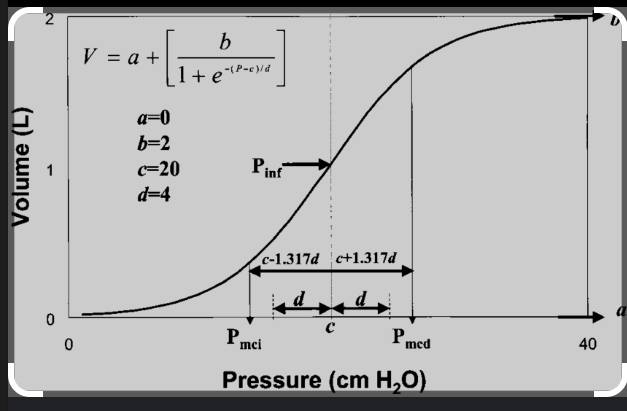        
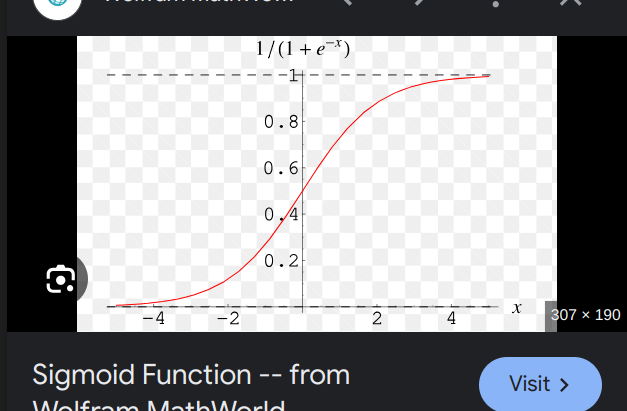        
    
        b.2.1 calculating output "using current weight" for every row

        b.2.2 calculate cost function for every row 0 or 1 for the predicted value
                                        MSE : Mean squared error
                                        MAE : Mean absolute error

            ###### logistics regression cost function
![Screenshot from 2024-05-31 16-42-37.png](<attachment:Screenshot from 2024-05-31 16-42-37.png>)
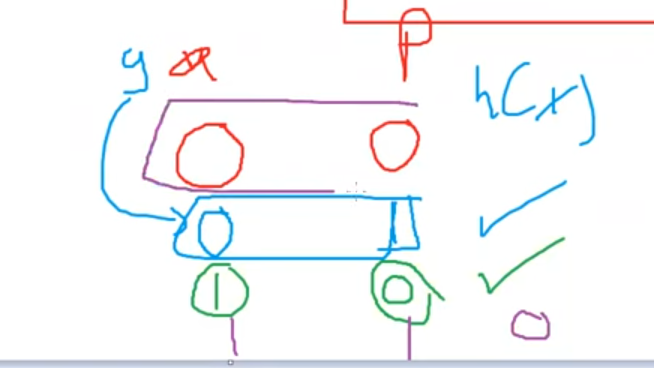
            ###### Penality and the effect of ln from 0 to 1 
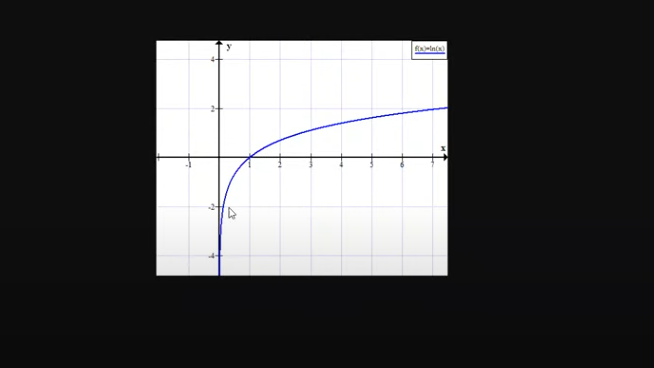            

        b.2.3 use GD to update thetas for every row : Graddient Descent for classification "Optimization"

##### for classifying MC
in regression and BC 
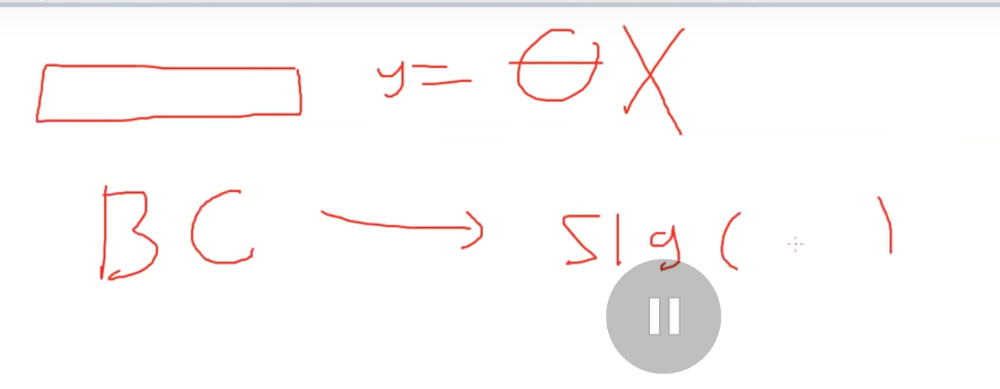
the same in MC but there is a litte difference, we will build equations with the same number of classes
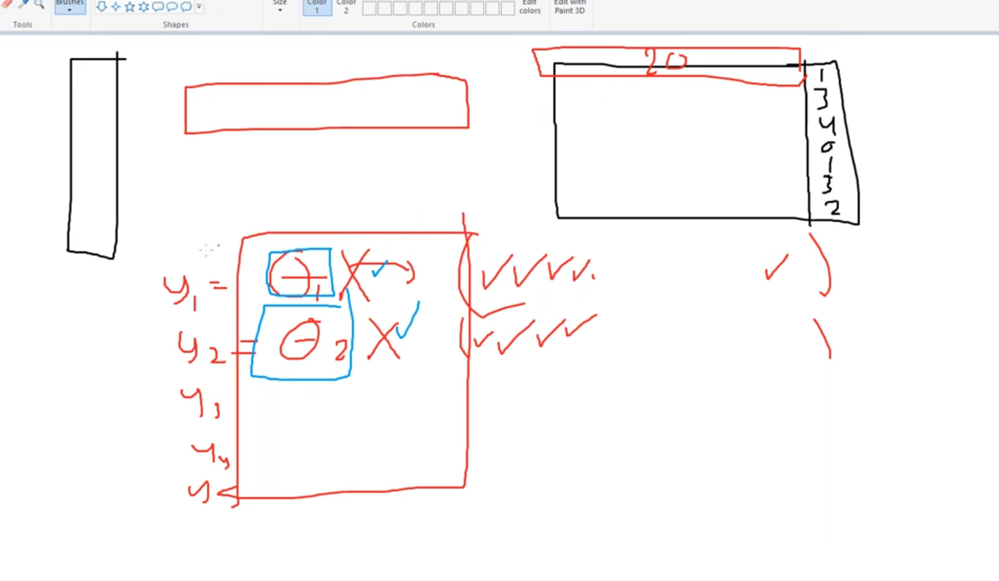

    b.1- building your equation
    b.2- Minimize theta
    b.3- predecting for the output but to be noted that we will predict the same number of classses and then use softmax
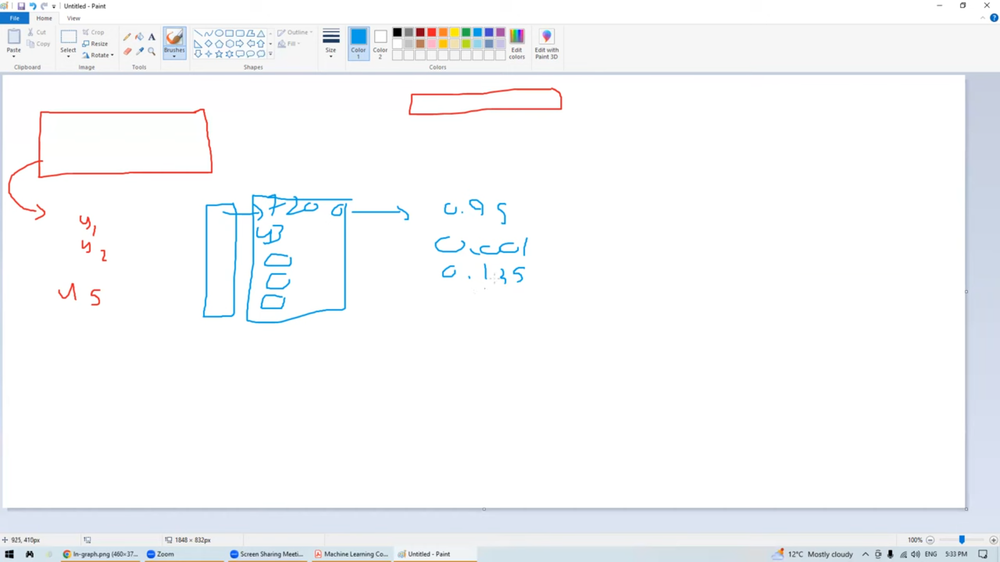
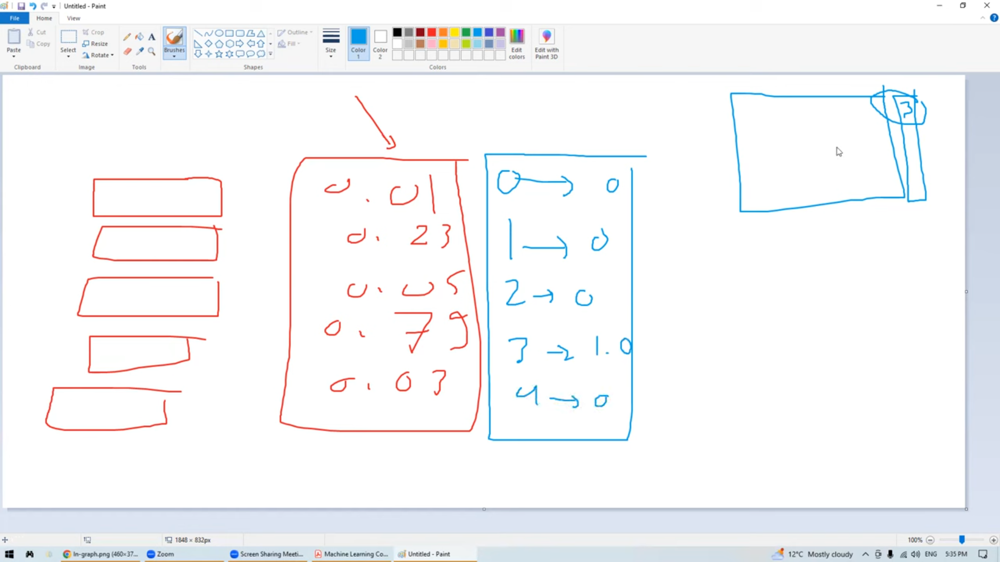    
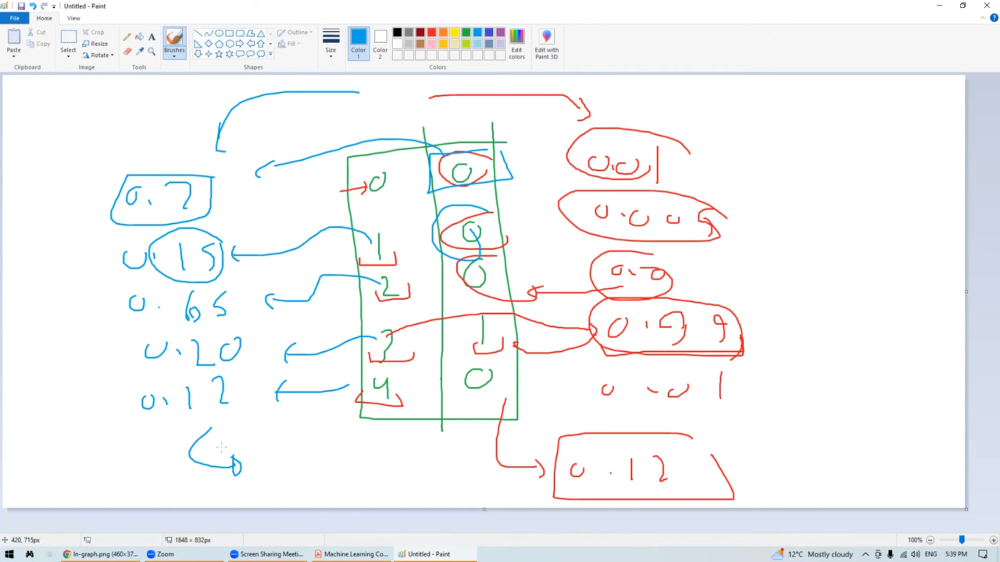

------------------------------------------------------------
#### Evaluation in classification
1- accuracy = no of true predections / no of total 
the most important thing to check that the calculated accurace is right cause perhabs i will be tricked in the calculation like the next example for crona virus
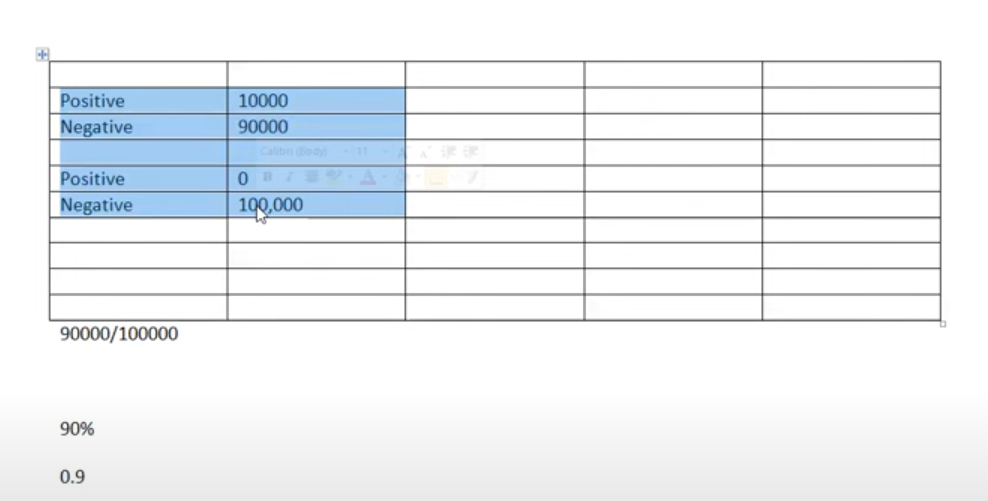

##### confusion matrix
    True positive
    true negative
    false positive
    false negative
this means if the person is patient so it will be positive, and for true means that my prediction is right
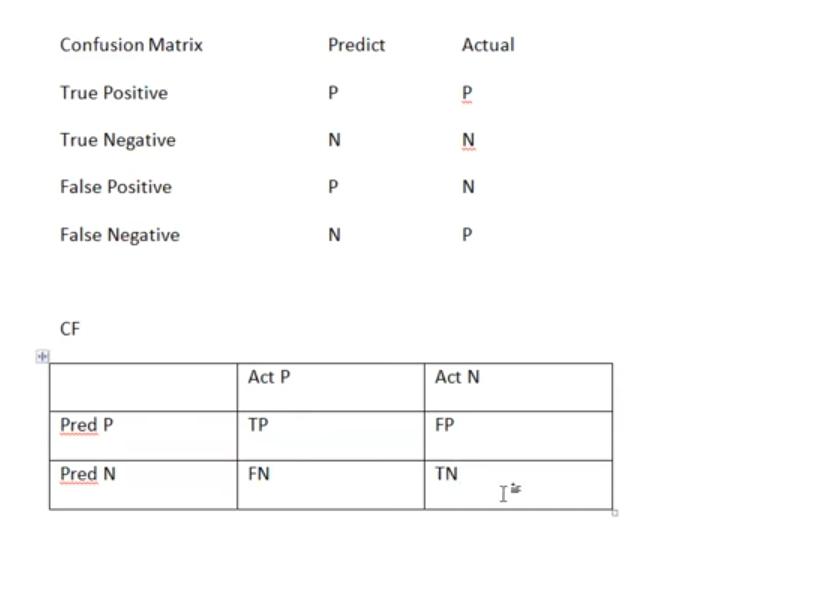
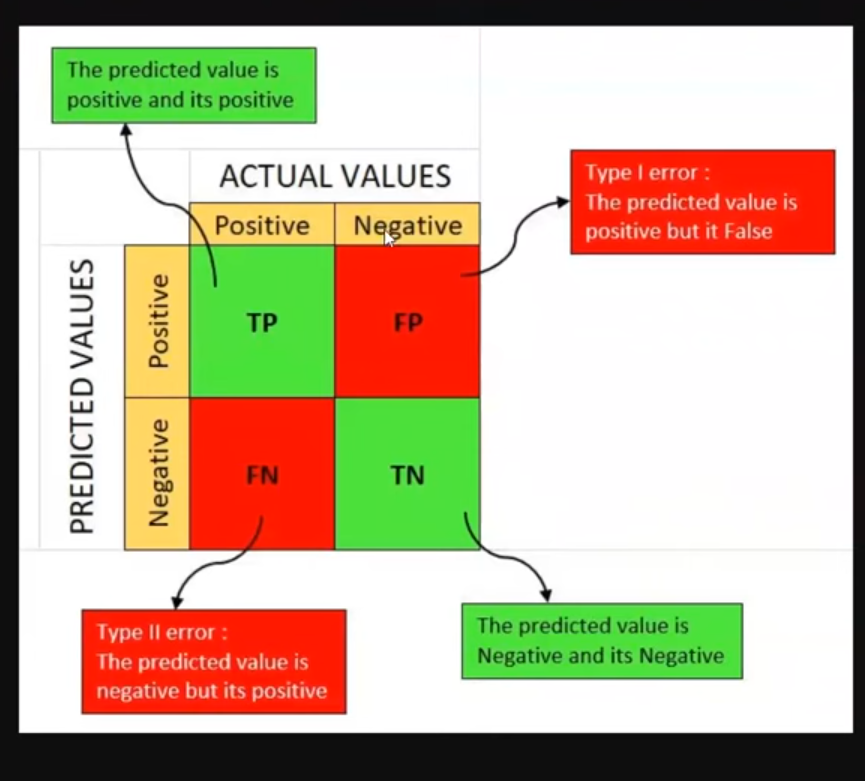
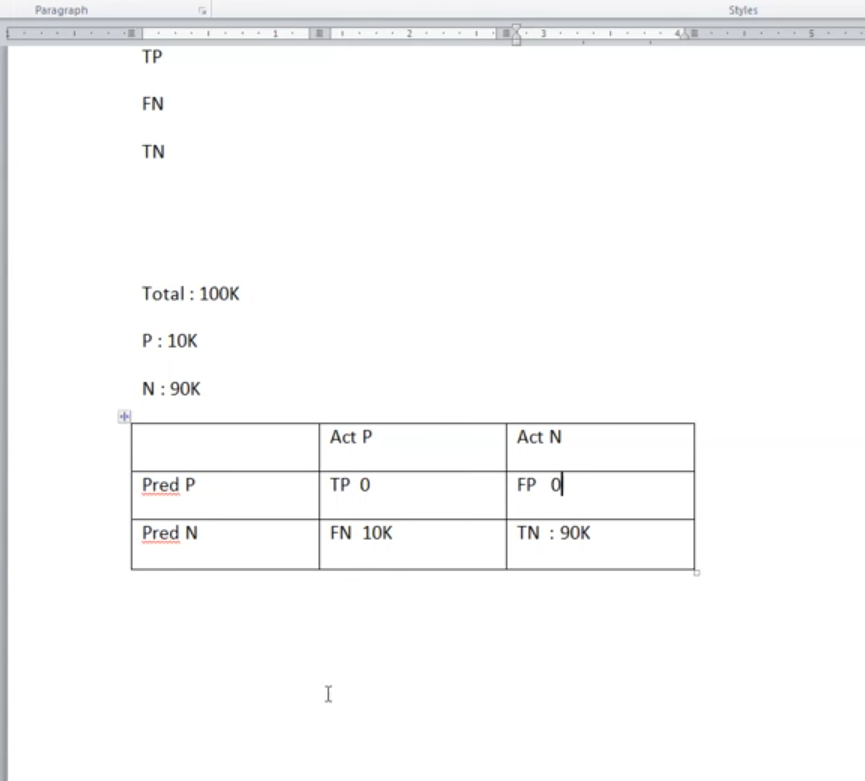
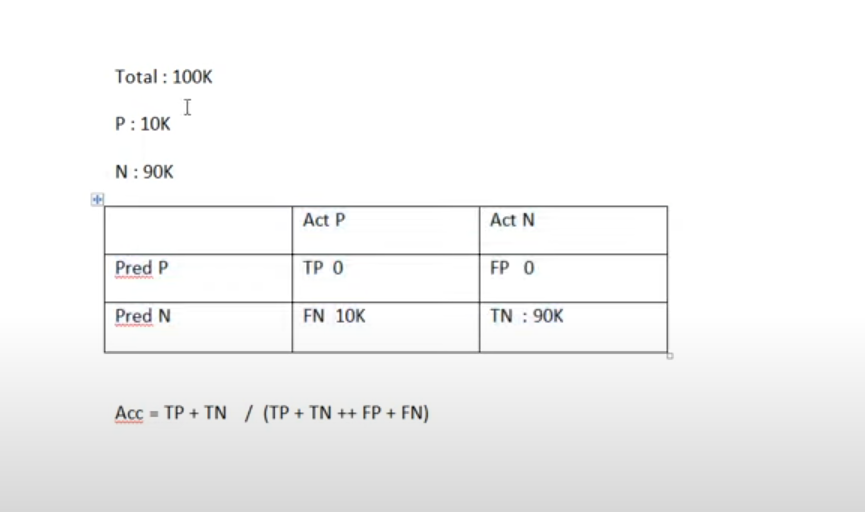

so, we need a tool to measure the accuracy :
    - Precision
    - Recall
    - F1Score

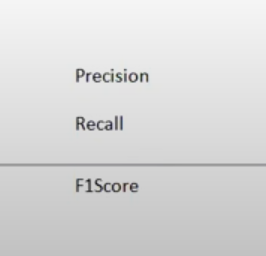

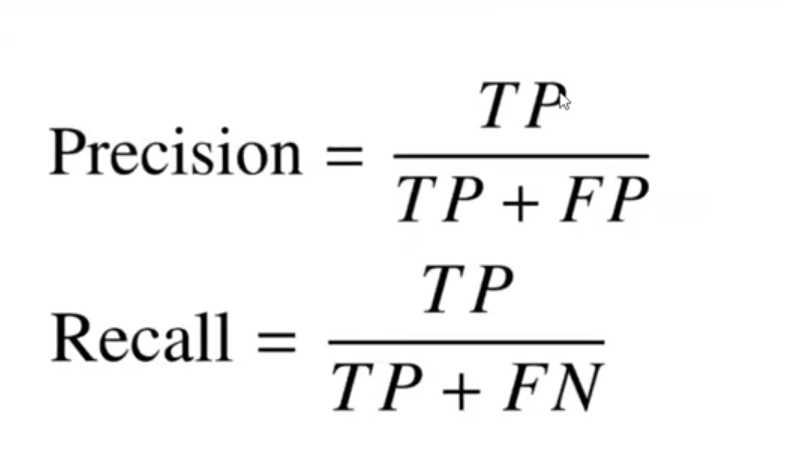

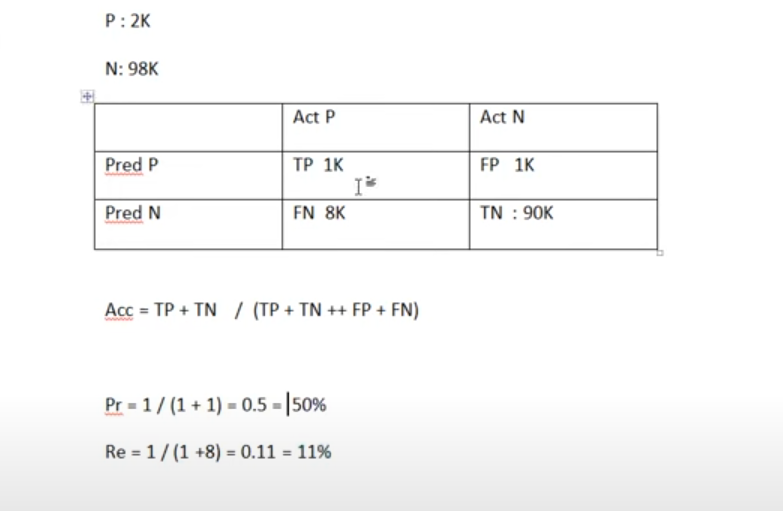

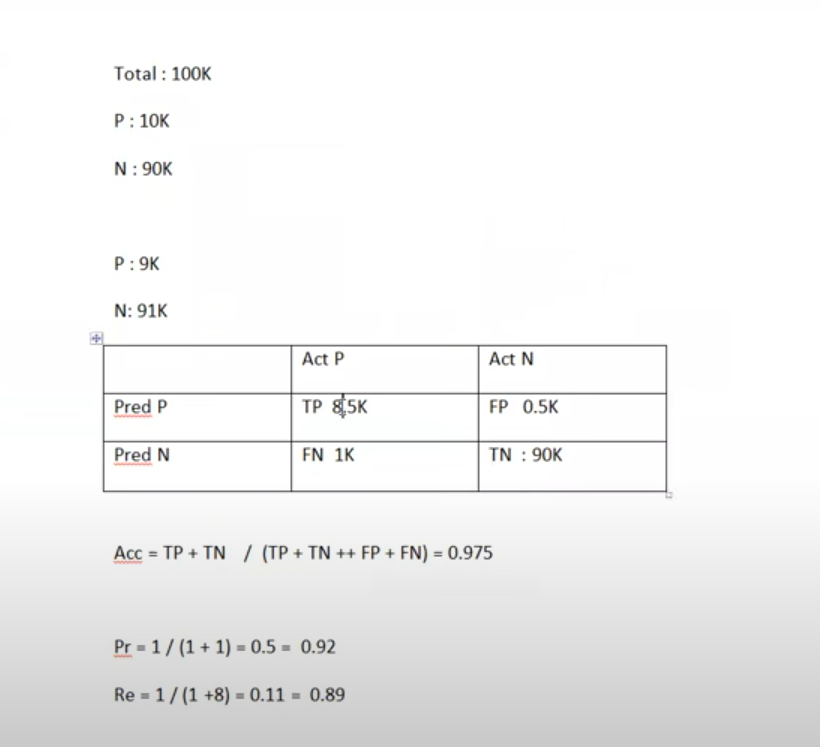

So, Be care that the accuracy is not always giving you the right insights cause somemodels must be applied another techniqes besides the accuracy like 
    - Precision
    - Recall
    - F1Score

Note that somtimes we prefer if the precision is higher than recall and others we prefer the recall according to the application
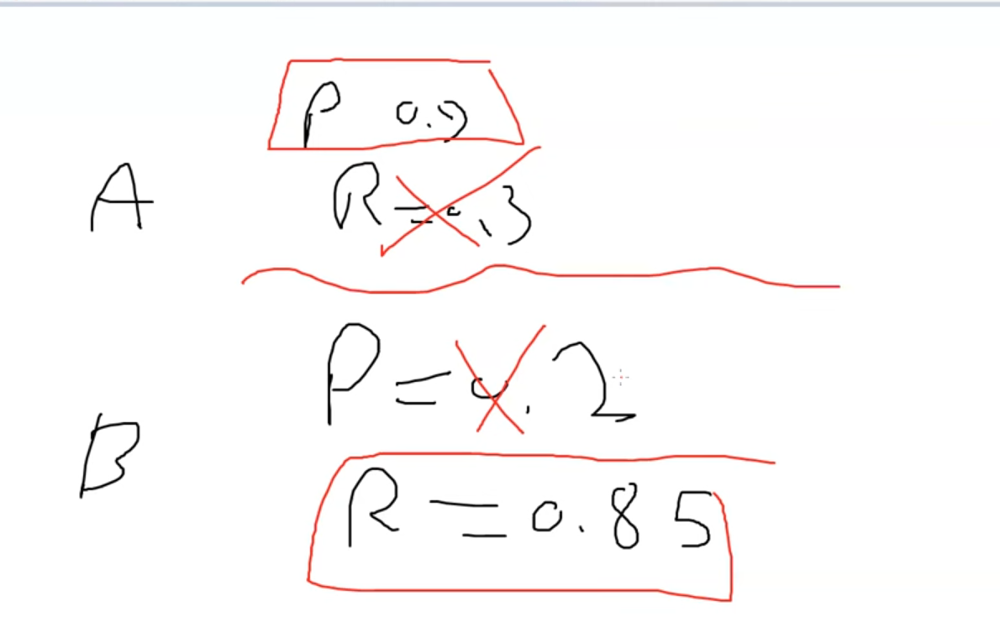

So, what is the difference between precision and recal. the only difference in Denominator for the second variable 
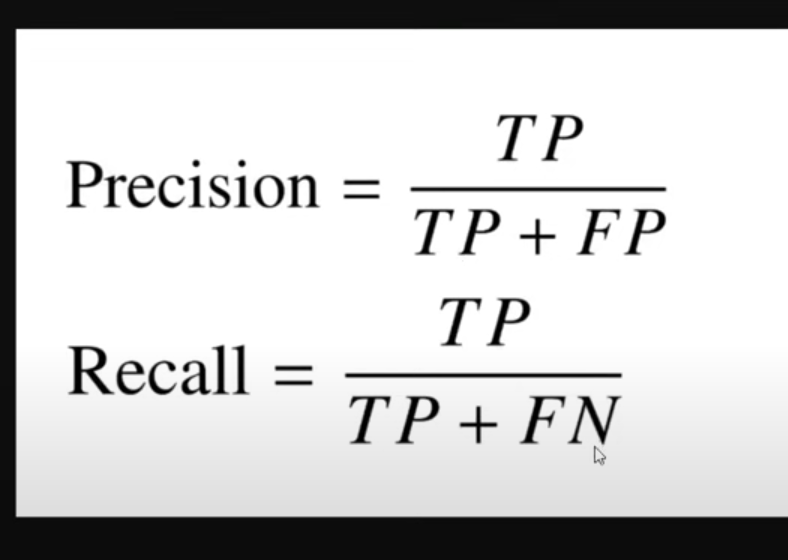
    - Fb:  
    - Fn: 
whereas the precision is inversely proportional with false positive and recall is inversely proportional with false negative


    - F1Score: we take care with it if we care with precision and recall at the same time
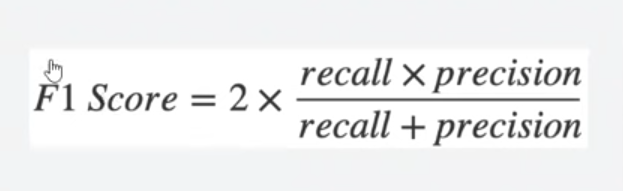



In [90]:
import pandas as pd

data = pd.read_csv('Airline Delay.csv')


In [91]:
data

,year,month,carrier,carrier_name,airport,airport_name,arr_flights,arr_del15,carrier_ct,weather_ct,...,security_ct,late_aircraft_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
0,2020,12,9E,Endeavor Air Inc.,ABE,"Allentown/Bethlehem/Easton, PA: Lehigh Valley ...",44.0,3.0,1.63,0.00,...,0.0,1.25,0.0,1.0,89.0,56.0,0.0,3.0,0.0,30.0
1,2020,12,9E,Endeavor Air Inc.,ABY,"Albany, GA: Southwest Georgia Regional",90.0,1.0,0.96,0.00,...,0.0,0.00,0.0,0.0,23.0,22.0,0.0,1.0,0.0,0.0
2,2020,12,9E,Endeavor Air Inc.,AEX,"Alexandria, LA: Alexandria International",88.0,8.0,5.75,0.00,...,0.0,0.65,0.0,1.0,338.0,265.0,0.0,45.0,0.0,28.0
3,2020,12,9E,Endeavor Air Inc.,AGS,"Augusta, GA: Augusta Regional at Bush Field",184.0,9.0,4.17,0.00,...,0.0,3.00,0.0,0.0,508.0,192.0,0.0,92.0,0.0,224.0
4,2020,12,9E,Endeavor Air Inc.,ALB,"Albany, NY: Albany International",76.0,11.0,4.78,0.00,...,0.0,1.00,1.0,0.0,692.0,398.0,0.0,178.0,0.0,116.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3346,2019,12,EV,ExpressJet Airlines LLC,AMA,"Amarillo, TX: Rick Husband Amarillo International",56.0,8.0,2.20,1.00,...,0.0,0.80,0.0,1.0,353.0,165.0,19.0,135.0,0.0,34.0
3347,2019,12,EV,ExpressJet Airlines LLC,ATL,"Atlanta, GA: Hartsfield-Jackson Atlanta Intern...",76.0,17.0,7.51,0.24,...,0.0,5.12,0.0,0.0,1880.0,1516.0,25.0,200.0,0.0,139.0
3348,2019,12,EV,ExpressJet Airlines LLC,AUS,"Austin, TX: Austin - Bergstrom International",7.0,1.0,0.00,0.48,...,0.0,0.00,0.0,0.0,96.0,0.0,46.0,50.0,0.0,0.0
3349,2019,12,EV,ExpressJet Airlines LLC,AVL,"Asheville, NC: Asheville Regional",12.0,1.0,0.00,0.00,...,0.0,0.00,0.0,0.0,23.0,0.0,0.0,23.0,0.0,0.0


In [92]:
data.dropna(inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3343 entries, 0 to 3350
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   year                 3343 non-null   int64  
 1   month                3343 non-null   int64  
 2   carrier              3343 non-null   object 
 3   carrier_name         3343 non-null   object 
 4   airport              3343 non-null   object 
 5   airport_name         3343 non-null   object 
 6   arr_flights          3343 non-null   float64
 7   arr_del15            3343 non-null   float64
 8   carrier_ct           3343 non-null   float64
 9   weather_ct           3343 non-null   float64
 10  nas_ct               3343 non-null   float64
 11  security_ct          3343 non-null   float64
 12  late_aircraft_ct     3343 non-null   float64
 13  arr_cancelled        3343 non-null   float64
 14  arr_diverted         3343 non-null   float64
 15  arr_delay            3343 non-null   f

In [93]:
data.columns

Index(['year', 'month', 'carrier', 'carrier_name', 'airport', 'airport_name',
       'arr_flights', 'arr_del15', 'carrier_ct', 'weather_ct', 'nas_ct',
       'security_ct', 'late_aircraft_ct', 'arr_cancelled', 'arr_diverted',
       'arr_delay', 'carrier_delay', 'weather_delay', 'nas_delay',
       'security_delay', 'late_aircraft_delay'],
      dtype='object')

In [94]:
y = data['carrier'] 

In [95]:
X = data[[ 'arr_flights', 'arr_del15', 'carrier_ct', 'weather_ct', 'nas_ct',
       'security_ct', 'late_aircraft_ct', 'arr_cancelled', 'arr_diverted',
       'arr_delay', 'carrier_delay', 'weather_delay', 'nas_delay',
       'security_delay', 'late_aircraft_delay']]

In [96]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3343 entries, 0 to 3350
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   arr_flights          3343 non-null   float64
 1   arr_del15            3343 non-null   float64
 2   carrier_ct           3343 non-null   float64
 3   weather_ct           3343 non-null   float64
 4   nas_ct               3343 non-null   float64
 5   security_ct          3343 non-null   float64
 6   late_aircraft_ct     3343 non-null   float64
 7   arr_cancelled        3343 non-null   float64
 8   arr_diverted         3343 non-null   float64
 9   arr_delay            3343 non-null   float64
 10  carrier_delay        3343 non-null   float64
 11  weather_delay        3343 non-null   float64
 12  nas_delay            3343 non-null   float64
 13  security_delay       3343 non-null   float64
 14  late_aircraft_delay  3343 non-null   float64
dtypes: float64(15)
memory usage: 417.9 KB


In [97]:
Data = data[data['carrier'].isin(['OO','DL'])]
Data

,year,month,carrier,carrier_name,airport,airport_name,arr_flights,arr_del15,carrier_ct,weather_ct,...,security_ct,late_aircraft_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
334,2020,12,DL,Delta Air Lines Inc.,ABQ,"Albuquerque, NM: Albuquerque International Sun...",41.0,4.0,3.37,0.00,...,0.0,0.00,1.0,0.0,850.0,835.0,0.0,15.0,0.0,0.0
335,2020,12,DL,Delta Air Lines Inc.,ALB,"Albany, NY: Albany International",32.0,5.0,2.47,0.00,...,0.0,0.00,0.0,0.0,327.0,146.0,0.0,181.0,0.0,0.0
336,2020,12,DL,Delta Air Lines Inc.,ANC,"Anchorage, AK: Ted Stevens Anchorage Internati...",158.0,31.0,8.07,0.88,...,0.0,4.75,2.0,0.0,1234.0,282.0,55.0,638.0,0.0,259.0
337,2020,12,DL,Delta Air Lines Inc.,ATL,"Atlanta, GA: Hartsfield-Jackson Atlanta Intern...",12420.0,1286.0,414.32,15.49,...,7.0,199.07,74.0,6.0,72853.0,38827.0,2024.0,20028.0,364.0,11610.0
338,2020,12,DL,Delta Air Lines Inc.,AUS,"Austin, TX: Austin - Bergstrom International",406.0,98.0,29.20,0.38,...,0.0,6.86,1.0,1.0,5917.0,3385.0,45.0,2102.0,0.0,385.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3338,2019,12,DL,Delta Air Lines Inc.,TUL,"Tulsa, OK: Tulsa International",86.0,3.0,1.17,0.70,...,0.0,0.83,0.0,0.0,157.0,95.0,16.0,7.0,0.0,39.0
3339,2019,12,DL,Delta Air Lines Inc.,TUS,"Tucson, AZ: Tucson International",90.0,20.0,6.95,1.62,...,0.0,7.39,0.0,0.0,861.0,383.0,55.0,103.0,0.0,320.0
3340,2019,12,DL,Delta Air Lines Inc.,TYS,"Knoxville, TN: McGhee Tyson",77.0,6.0,5.53,0.00,...,0.0,0.00,0.0,0.0,240.0,233.0,0.0,7.0,0.0,0.0
3341,2019,12,DL,Delta Air Lines Inc.,VPS,"Valparaiso, FL: Eglin AFB Destin Fort Walton B...",152.0,11.0,7.06,0.48,...,0.0,2.33,0.0,0.0,620.0,498.0,13.0,34.0,0.0,75.0


In [98]:
Data['carrier'].value_counts()


OO    479
DL    252
Name: carrier, dtype: int64

In [99]:
y = Data['carrier'] 
X = Data[[ 'arr_flights', 'arr_del15', 'carrier_ct', 'weather_ct', 'nas_ct',
       'security_ct', 'late_aircraft_ct', 'arr_cancelled', 'arr_diverted',
       'arr_delay', 'carrier_delay', 'weather_delay', 'nas_delay',
       'security_delay', 'late_aircraft_delay']]

In [100]:
y.value_counts()

OO    479
DL    252
Name: carrier, dtype: int64

In [101]:
# Data splitting 
# Import Libraries
from sklearn.model_selection import train_test_split
#----------------------------------------------------

#----------------------------------------------------
#Splitting data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=44, shuffle =True)

#Splitted Data
print('X_train shape is ' , X_train.shape)
print('X_test shape is ' , X_test.shape)
print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)

X_train shape is  (548, 15)
X_test shape is  (183, 15)
y_train shape is  (548,)
y_test shape is  (183,)


In [102]:
# building ML Model
# Import Libraries
from sklearn.model_selection import train_test_split
#----------------------------------------------------

#----------------------------------------------------
#Splitting data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=44, shuffle =True)

#Splitted Data
print('X_train shape is ' , X_train.shape)
print('X_test shape is ' , X_test.shape)
print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)



X_train shape is  (548, 15)
X_test shape is  (183, 15)
y_train shape is  (548,)
y_test shape is  (183,)


In [103]:
from sklearn.ensemble import RandomForestClassifier

RandomForestClassifierModel = RandomForestClassifier(criterion = 'gini',n_estimators=100,max_depth=2,random_state=33) #criterion can be also : entropy 
RandomForestClassifierModel.fit(X_train, y_train)

#Calculating Details
print('RandomForestClassifierModel Train Score is : ' , RandomForestClassifierModel.score(X_train, y_train))
print('RandomForestClassifierModel Test Score is : ' , RandomForestClassifierModel.score(X_test, y_test))
print('RandomForestClassifierModel features importances are : ' , RandomForestClassifierModel.feature_importances_)
print('----------------------------------------------------')



RandomForestClassifierModel Train Score is :  0.7354014598540146
RandomForestClassifierModel Test Score is :  0.6775956284153005
RandomForestClassifierModel features importances are :  [0.09577533 0.06900331 0.03940426 0.03998838 0.22246389 0.00562075
 0.02312818 0.16481196 0.00628785 0.03883324 0.03270608 0.06306118
 0.11706902 0.00193219 0.07991439]
----------------------------------------------------


In [104]:
#Calculating Prediction
y_pred = RandomForestClassifierModel.predict(X_test)
y_pred_prob = RandomForestClassifierModel.predict_proba(X_test)
print('Predicted Value for RandomForestClassifierModel is : ' , y_pred[:10])
print('Prediction Probabilities Value for RandomForestClassifierModel is : ' , y_pred_prob[:10])

Predicted Value for RandomForestClassifierModel is :  ['OO' 'OO' 'OO' 'OO' 'OO' 'OO' 'OO' 'OO' 'OO' 'OO']
Prediction Probabilities Value for RandomForestClassifierModel is :  [[0.33661332 0.66338668]
 [0.32485994 0.67514006]
 [0.44047662 0.55952338]
 [0.35830162 0.64169838]
 [0.43702643 0.56297357]
 [0.30169513 0.69830487]
 [0.41346021 0.58653979]
 [0.18907975 0.81092025]
 [0.29709034 0.70290966]
 [0.4425274  0.5574726 ]]


In [105]:
y_pred

array(['OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO',
       'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO',
       'DL', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO',
       'OO', 'OO', 'DL', 'OO', 'OO', 'OO', 'OO', 'OO', 'DL', 'OO', 'OO',
       'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'DL', 'OO', 'OO',
       'OO', 'DL', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO',
       'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'DL', 'OO', 'OO', 'OO',
       'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'DL', 'OO', 'OO', 'OO',
       'OO', 'OO', 'OO', 'DL', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO',
       'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO',
       'OO', 'OO', 'OO', 'OO', 'OO', 'DL', 'OO', 'OO', 'OO', 'OO', 'OO',
       'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO',
       'OO', 'OO', 'DL', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO',
       'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'OO', 'O

In [106]:
#Import Libraries
from sklearn.metrics import classification_report
#----------------------------------------------------

#----------------------------------------------------
#Calculating classification Report :  
ClassificationReport = classification_report(y_test,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

          DL       0.71      0.18      0.29        66
          OO       0.67      0.96      0.79       117

    accuracy                           0.68       183
   macro avg       0.69      0.57      0.54       183
weighted avg       0.69      0.68      0.61       183



In [107]:
# Multi calssification

y = data['carrier'] 
X = data[[ 'arr_flights', 'arr_del15', 'carrier_ct', 'weather_ct', 'nas_ct',
       'security_ct', 'late_aircraft_ct', 'arr_cancelled', 'arr_diverted',
       'arr_delay', 'carrier_delay', 'weather_delay', 'nas_delay',
       'security_delay', 'late_aircraft_delay']]

y.value_counts()



OO    479
MQ    285
DL    252
G4    240
9E    226
YV    219
AA    199
YX    196
UA    191
OH    187
F9    184
WN    181
AS    144
B6    120
EV    106
NK     97
HA     37
Name: carrier, dtype: int64

In [108]:
# Data splitting 
# Import Libraries
from sklearn.model_selection import train_test_split
#----------------------------------------------------

#----------------------------------------------------
#Splitting data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=44, shuffle =True)

#Splitted Data
print('X_train shape is ' , X_train.shape)
print('X_test shape is ' , X_test.shape)
print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)



X_train shape is  (2507, 15)
X_test shape is  (836, 15)
y_train shape is  (2507,)
y_test shape is  (836,)


In [109]:

from sklearn.ensemble import RandomForestClassifier

RandomForestClassifierModel = RandomForestClassifier(criterion = 'gini',n_estimators=100,max_depth=2,random_state=33) #criterion can be also : entropy 
RandomForestClassifierModel.fit(X_train, y_train)

#Calculating Details
print('RandomForestClassifierModel Train Score is : ' , RandomForestClassifierModel.score(X_train, y_train))
print('RandomForestClassifierModel Test Score is : ' , RandomForestClassifierModel.score(X_test, y_test))
print('RandomForestClassifierModel features importances are : ' , RandomForestClassifierModel.feature_importances_)
print('----------------------------------------------------')



#Calculating Prediction
y_pred = RandomForestClassifierModel.predict(X_test)
y_pred_prob = RandomForestClassifierModel.predict_proba(X_test)
print('Predicted Value for RandomForestClassifierModel is : ' , y_pred[:10])
print('Prediction Probabilities Value for RandomForestClassifierModel is : ' , y_pred_prob[:10])

y_pred

#Import Libraries
from sklearn.metrics import classification_report
#----------------------------------------------------

#----------------------------------------------------
#Calculating classification Report :  
ClassificationReport = classification_report(y_test,y_pred)
print('Classification Report is : ', ClassificationReport )

RandomForestClassifierModel Train Score is :  0.20821699242122058
RandomForestClassifierModel Test Score is :  0.18779904306220097
RandomForestClassifierModel features importances are :  [0.12228641 0.06615549 0.16921272 0.06003201 0.15254728 0.01219555
 0.01631766 0.02105249 0.00164597 0.05043721 0.09862677 0.04020061
 0.13488139 0.02799286 0.02641558]
----------------------------------------------------
Predicted Value for RandomForestClassifierModel is :  ['OO' 'OO' 'MQ' 'MQ' 'OO' 'MQ' 'G4' 'OO' 'OO' 'OO']
Prediction Probabilities Value for RandomForestClassifierModel is :  [[0.06295643 0.08118077 0.03153159 0.05703491 0.08396873 0.03393648
  0.03614922 0.03704338 0.00932146 0.05345002 0.02959208 0.05676209
  0.16051269 0.05258368 0.08546978 0.07524817 0.05325853]
 [0.05146735 0.09207369 0.03418671 0.05857203 0.10622507 0.02420167
  0.0298946  0.02648171 0.00725432 0.043054   0.04070399 0.046351
  0.15141264 0.06107285 0.10895752 0.05407479 0.06401605]
 [0.09232183 0.04111992 0.0386

/home/ahmed-ferganey/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ahmed-ferganey/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/ahmed-ferganey/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Confusion Matrix is : 
 [[  0   0   0   0   0   0   0   1   0  17   0   0  22   0   0   0   0]
 [  0   0   0   0   0   0   0   2   0  11   0   0  33   0   4   0   0]
 [  0   0   0   0   0   0   0   1   0  31   0   0  22   0   1   0   0]
 [  0   0   0   0   0   0   0   2   0   9   0   0  19   0   0   0   0]
 [  0   0   0   0   0   0   0   1   0   9   0   0  41   0   1   0   0]
 [  0   0   0   0   0   0   0   4   0   8   0   0  12   0   0   0   0]
 [  0   0   0   0   0   0   0   7   0  20   0   0  25   0   0   0   0]
 [  0   0   0   0   0   0   0   7   0  30   0   0  18   0   1   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0  10   0   0   0   0]
 [  0   0   0   0   0   0   0   4   0  33   0   0  20   0   0   0   0]
 [  0   0   0   0   0   0   0   1   0  12   0   0  11   0   1   0   0]
 [  0   0   0   0   0   0   0   0   0  19   0   0  29   0   2   0   0]
 [  0   0   0   0   0   0   0   0   0  14   0   0 107   0   0   0   0]
 [  0   0   0   0   0   0   0   4   0  26   0   0  33

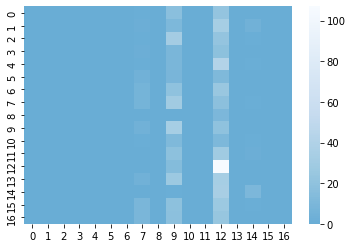

In [110]:
#Import Libraries
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
#----------------------------------------------------

#----------------------------------------------------
#Calculating Confusion Matrix
CM = confusion_matrix(y_test, y_pred)
print('Confusion Matrix is : \n', CM)

# drawing confusion matrix
sns.heatmap(CM, center = True,cmap='Blues_r')
plt.show()

-------------------------------------------------------
### 2- USML
deal with unlabeled data "NO o/p"
#### a- clustering
- when handle structured data "table" in regression or clasification we have some featers and the output whereas we select the target according the required application but in clustering we do not have the output 
- when handle unstructured data, having labeled and unlabeled data. where as image and audio and video and text are concerning with unstructured data. like we develop model for classification for an image. and most application of social media platform uses this techniques to classify if an oamge is violane or not like facebook. 
- imagne we have folder for iamges which is mixture of violance and non-violence if this mixture isnot differenitied this will be unlabeld but if it will be differentitated then it will be labeled
- if we have unlabeled data we can convert to labeled but needing an expert to can convert it
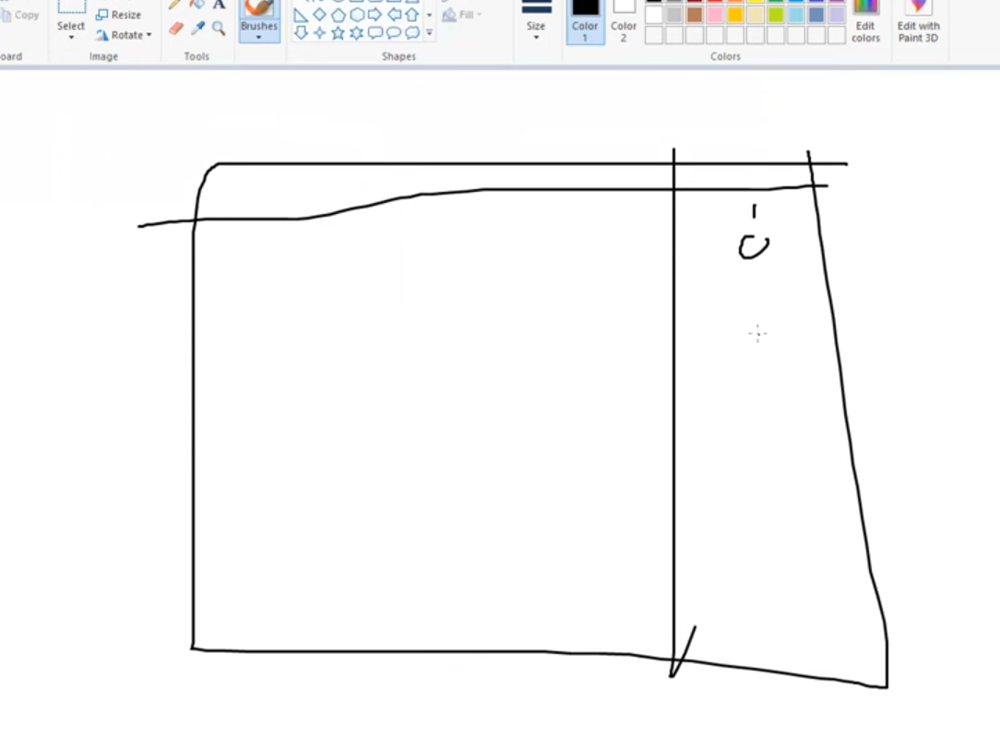
imagine that the violance will be 1 and non-violance will be 0 
and we still have low accuracy during converting to labeled because it need more effort and experience
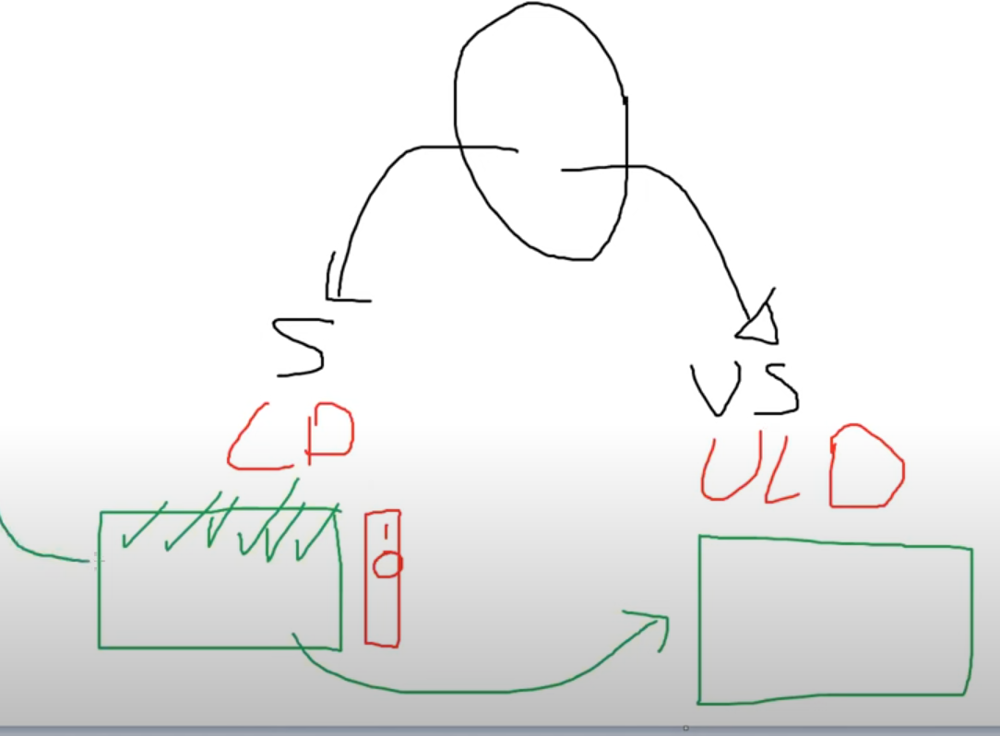

- it is also called blind classification
imagine we have unlabeled data for the houses and we have 3 houses have identical conditions 
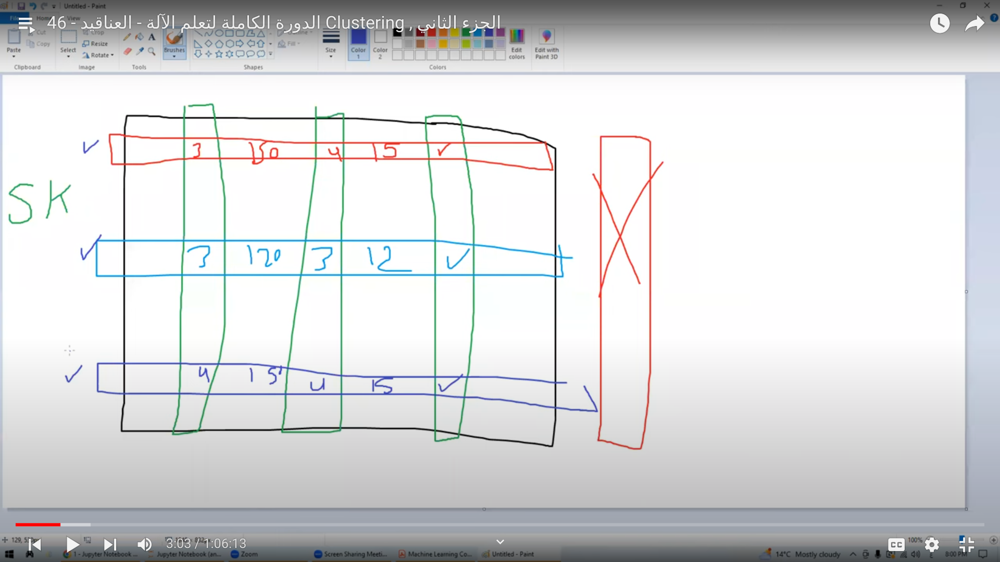
we will group it. this group is called cluster 
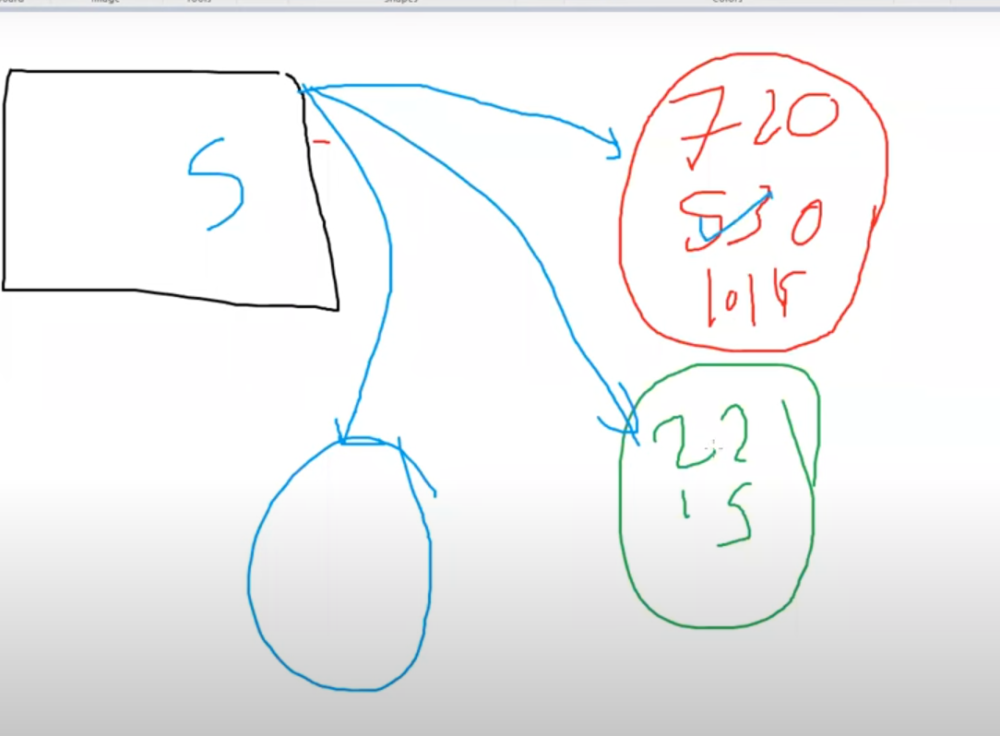

- the number of clusters is predefined numbers 

- in clustering, it is difficult to cluster the data accordng to anuthing i need it. but i will sacrifice with features to another feature. for example i have 10000 students and i need to classify them according to gender, location, ....etc

- Client segmentation, is the most importnat application of clustering. to be noted that clustering is very importnat for business and mmediacal field
for example missan have 200K customers and it is cclassified to segmentations and every segment expect that the quality levvel, cost, appereance, featers 

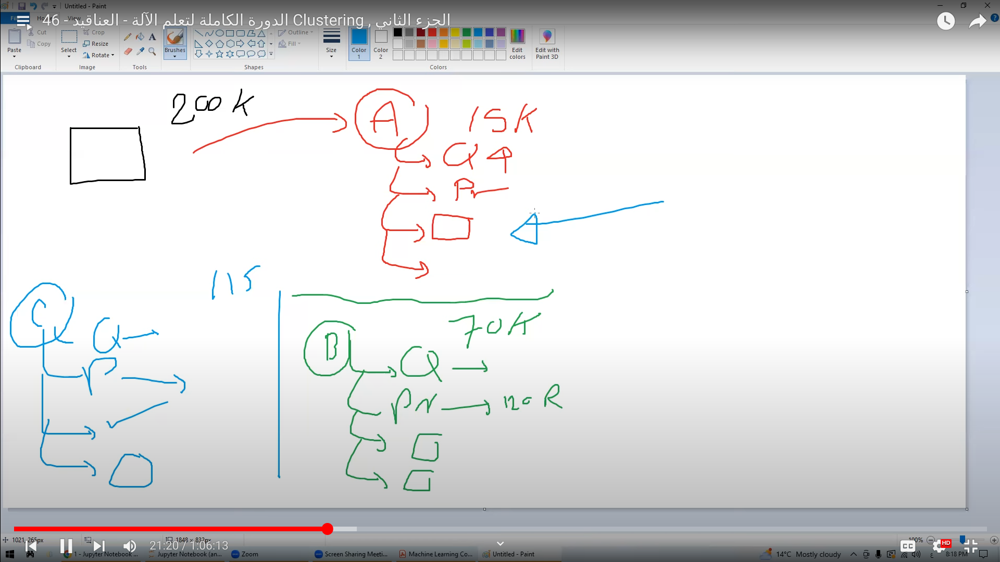

if the need to plan for new model,, how they select the proper feature for updating to eery segmment so AI will help us to get info about this.

when we get a lot of feature for every client segment we will get for good info help us to predict the behavior of client


- for example facebook, segment love videos, another share posts, and others read posts without sharing so all of these segments are clustering

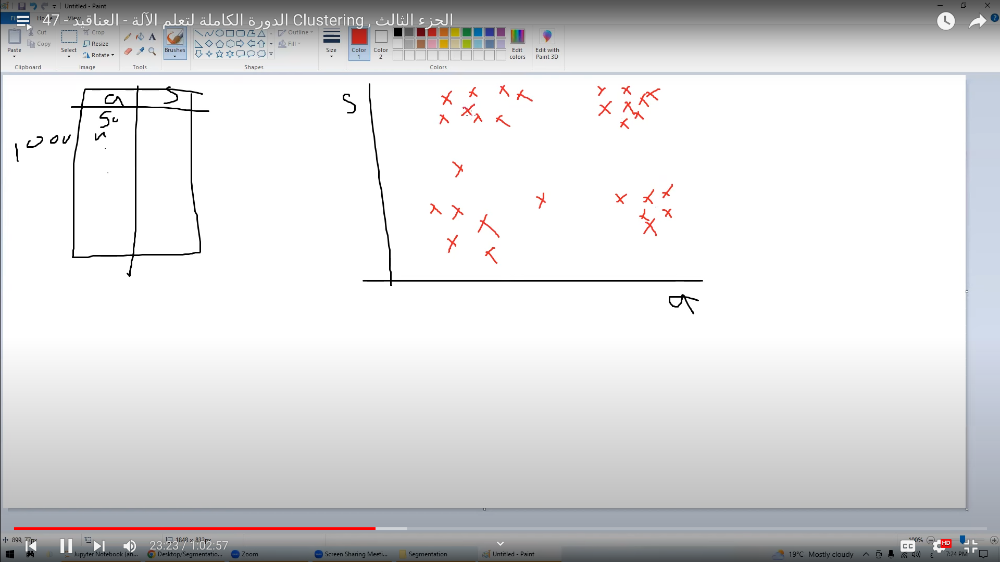
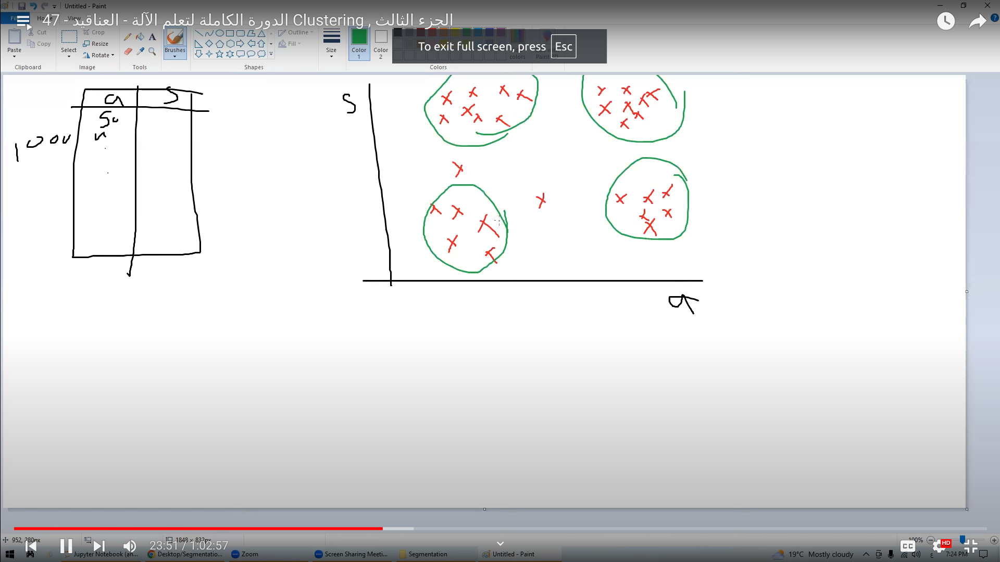

##### steps of building model by k-means
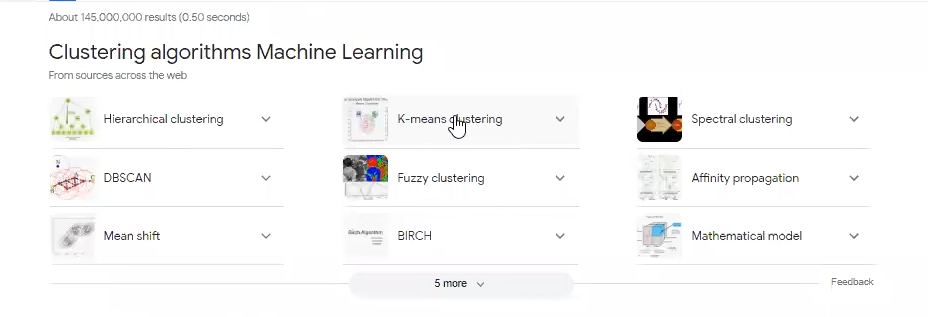
1- Put centers randomly 
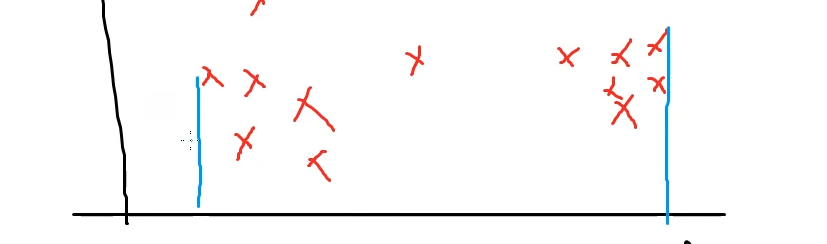
but it is prefered to put it in range for example the data for age and in between 16 and 50 so put the centers between these values
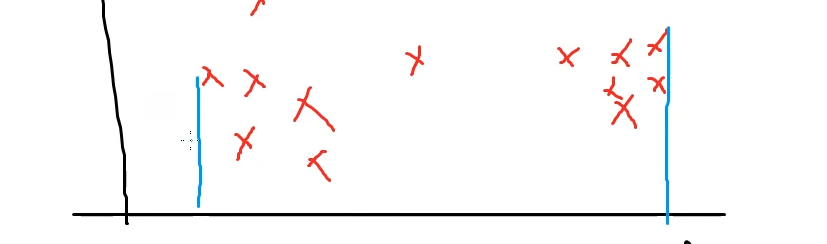


2- get means among the centers and all of points. every center to every point whether in the same cluster or not 
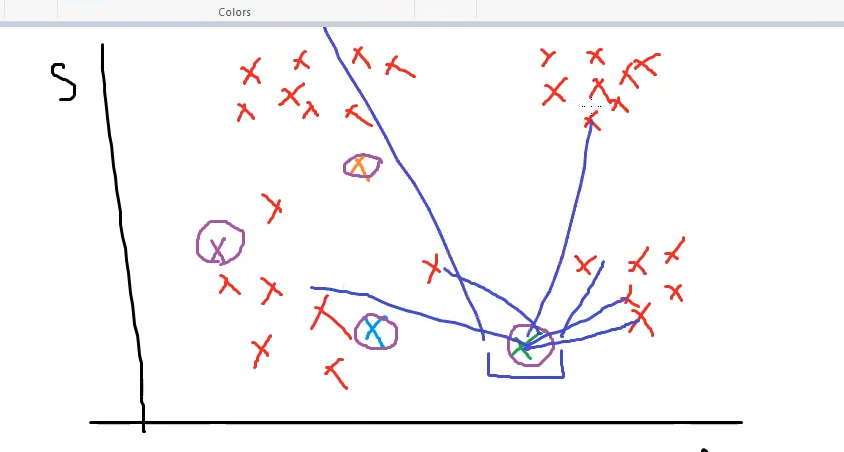
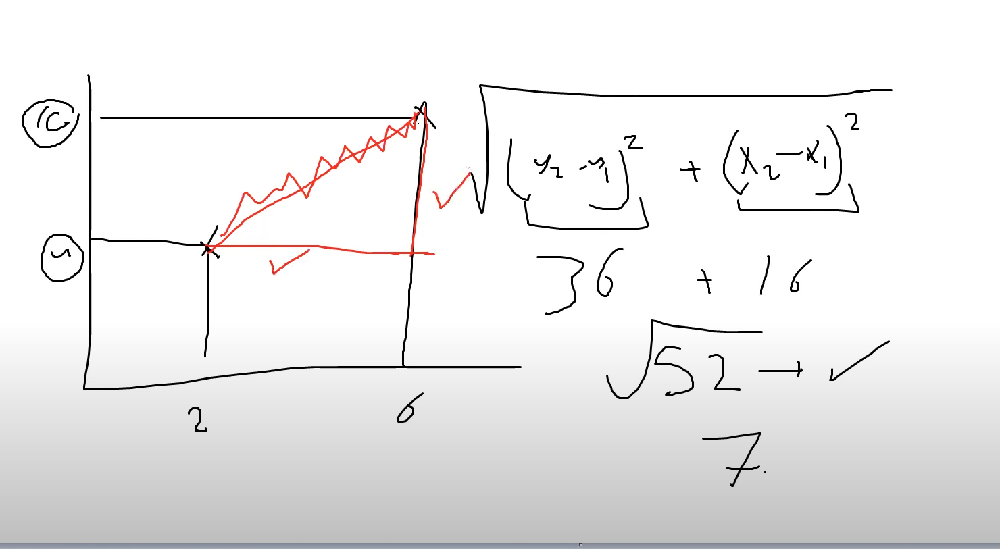


3- labeling points, where as we will label every point to the nearest cluster
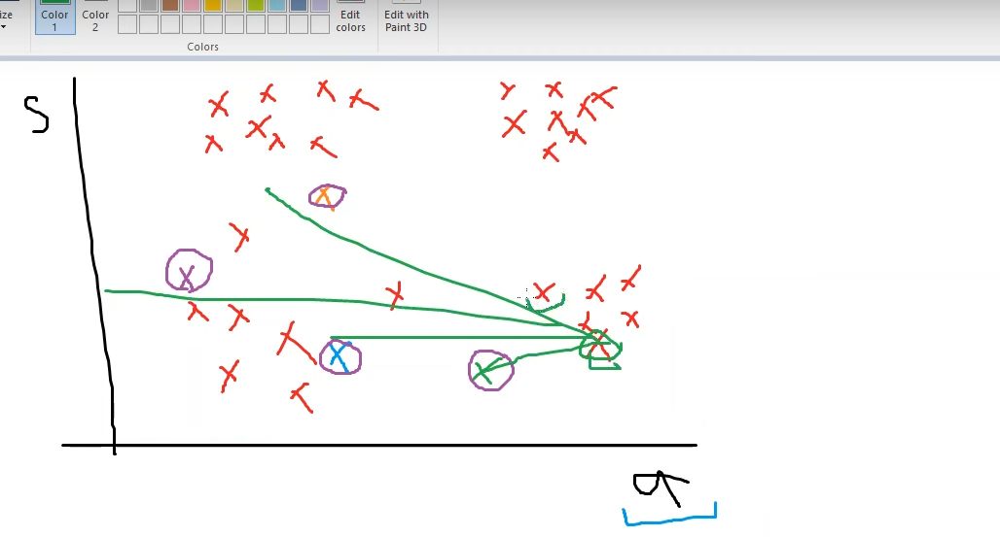

4- moving center, 
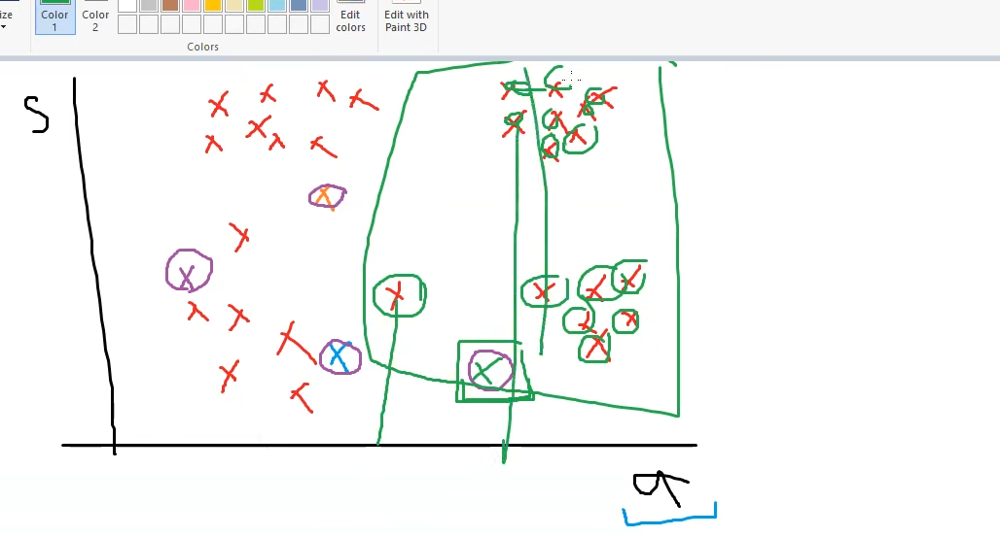
whereas we will calculate the avg and transmit the center to it 
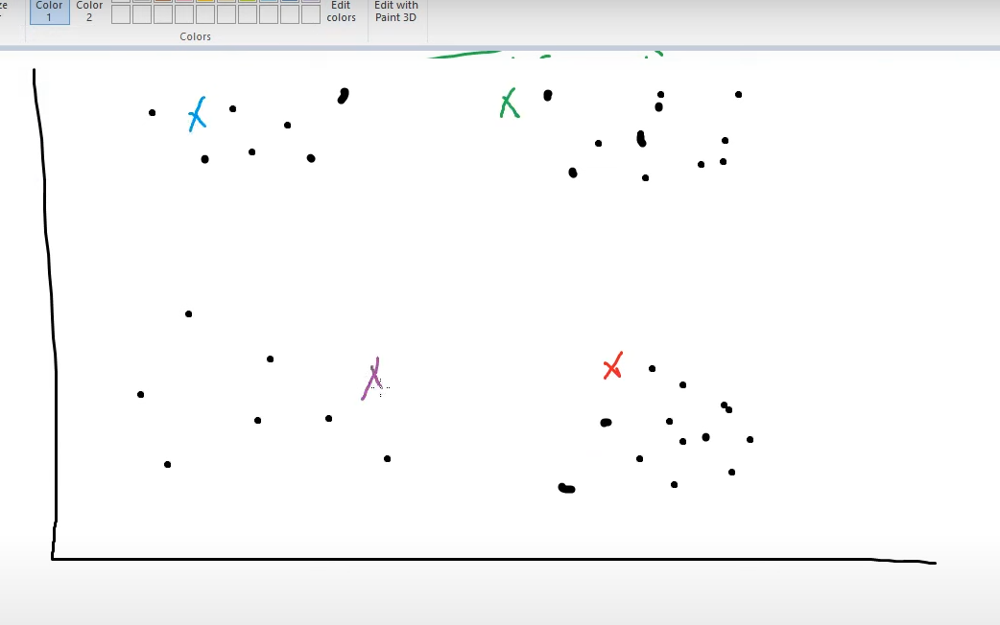

but we still didnot get the optimum cente, so we will repeate the steps from 2 to 4 for every point till get the optimal center
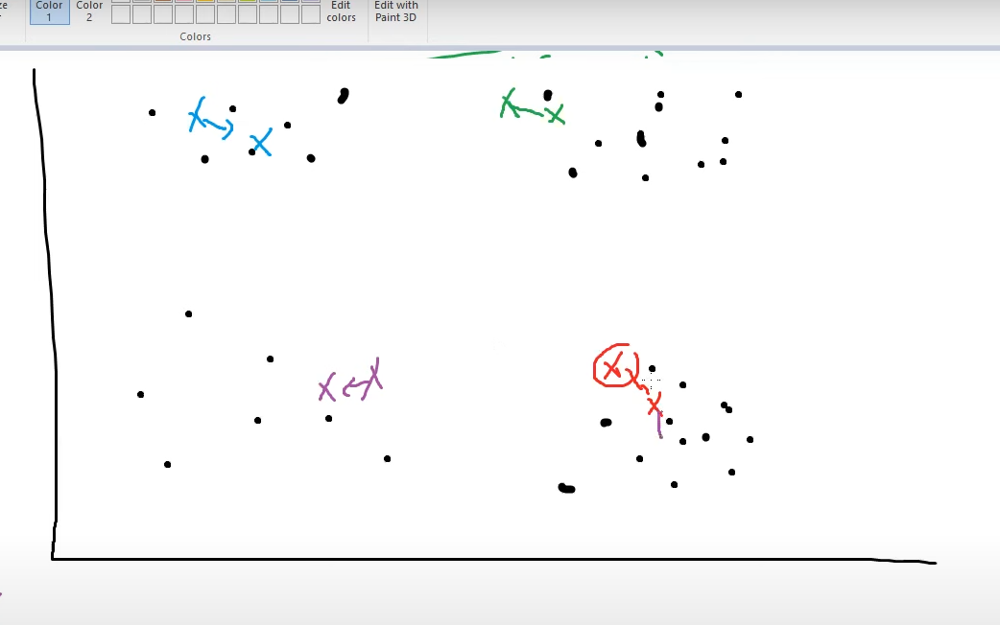

- Example
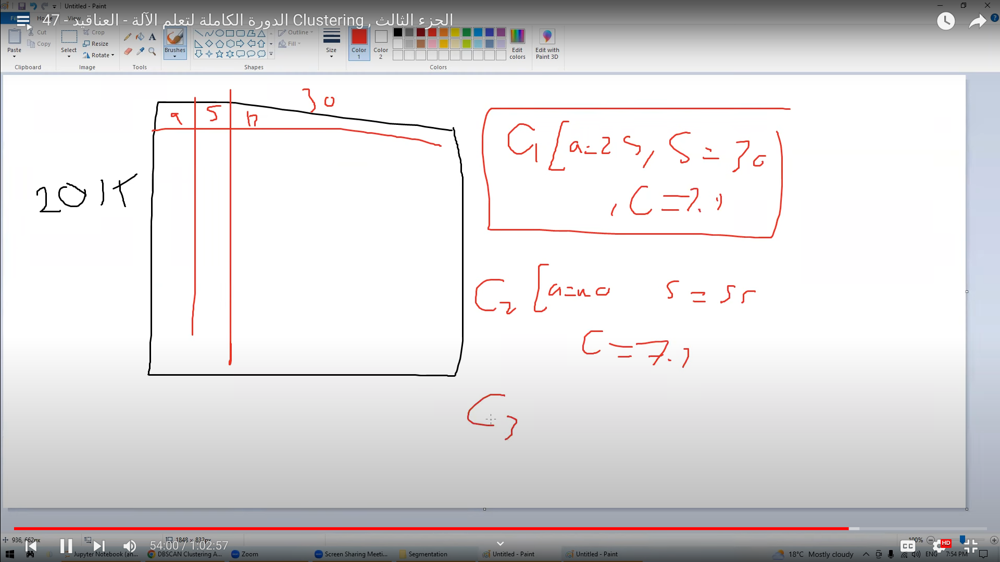

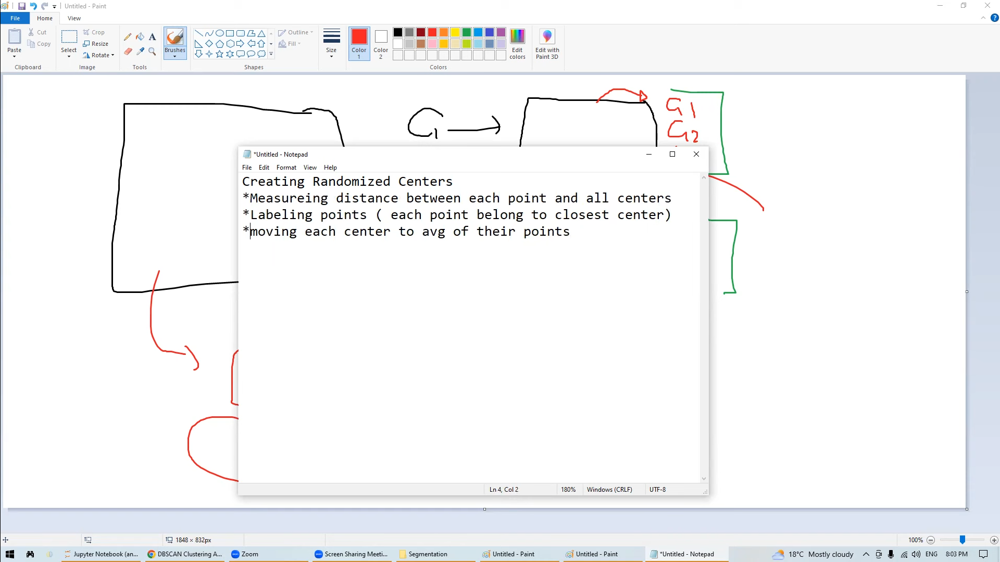



##### What if we have old VS new data ?
this is possible but there is condition must be applied otherwise the results will be inaccurate
if the old and neww have the same range  


##### Evaluation
there is big issue through the evaluation of cluster because no clear method to determine that the model is accurate but there is some methods can be applied
    1- SSD  "sum of squraed distance" 
    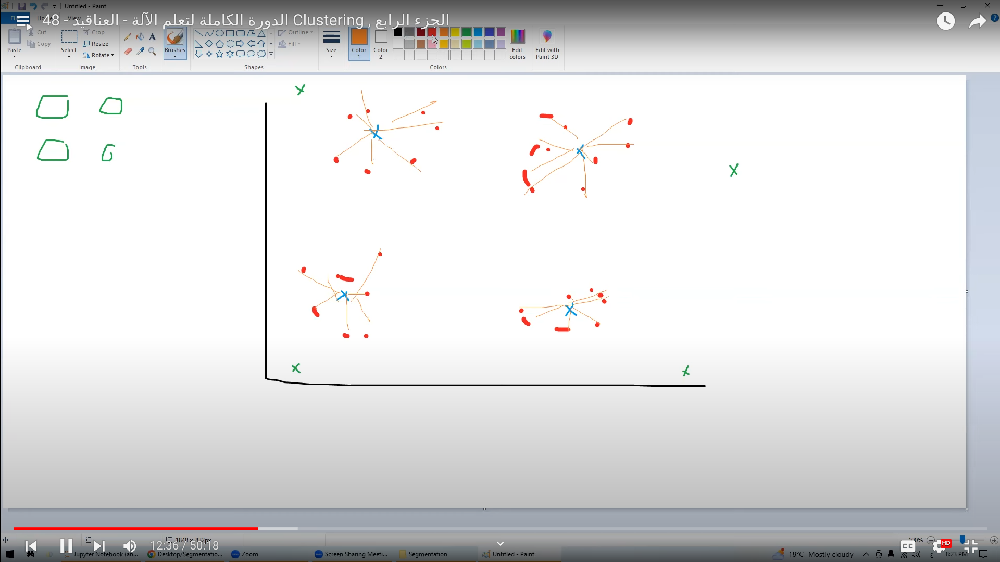
    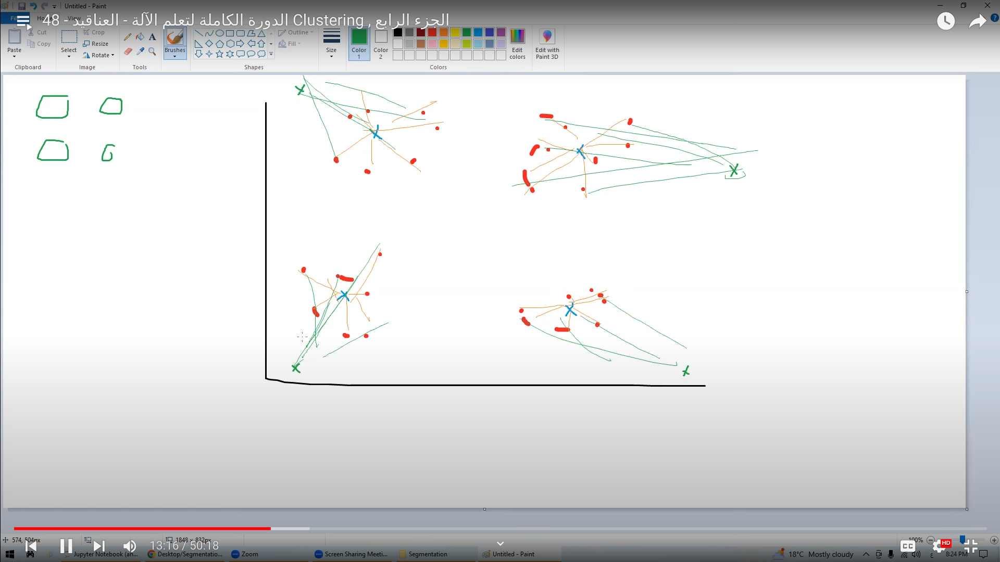
the sum of orange is less than sum of green so the orange is more accurate

for example, nissan brand will decide to work with company x or y according to which will produce clustering with minimual SSD
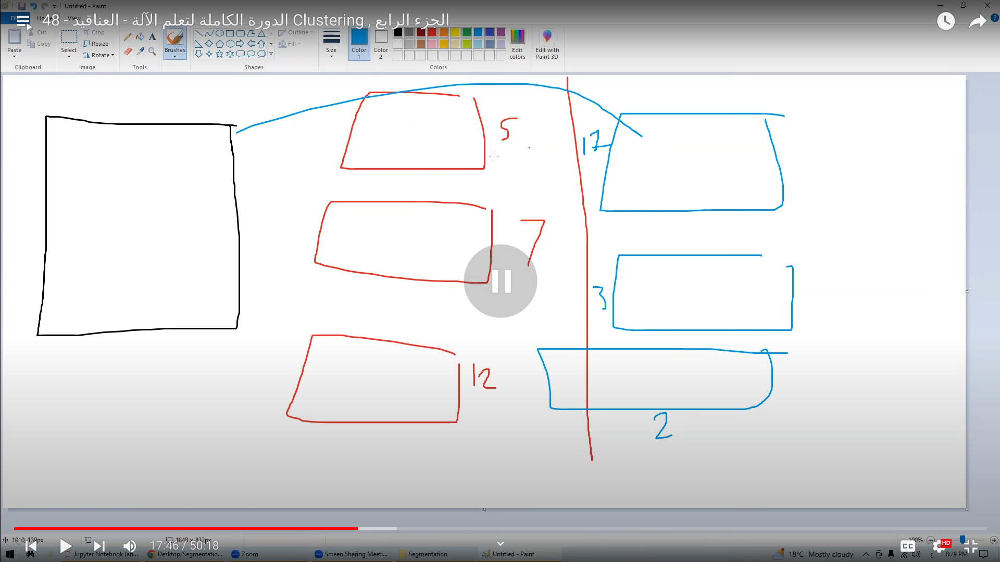

the goal of cluster to make the homogenous data in one cluster 
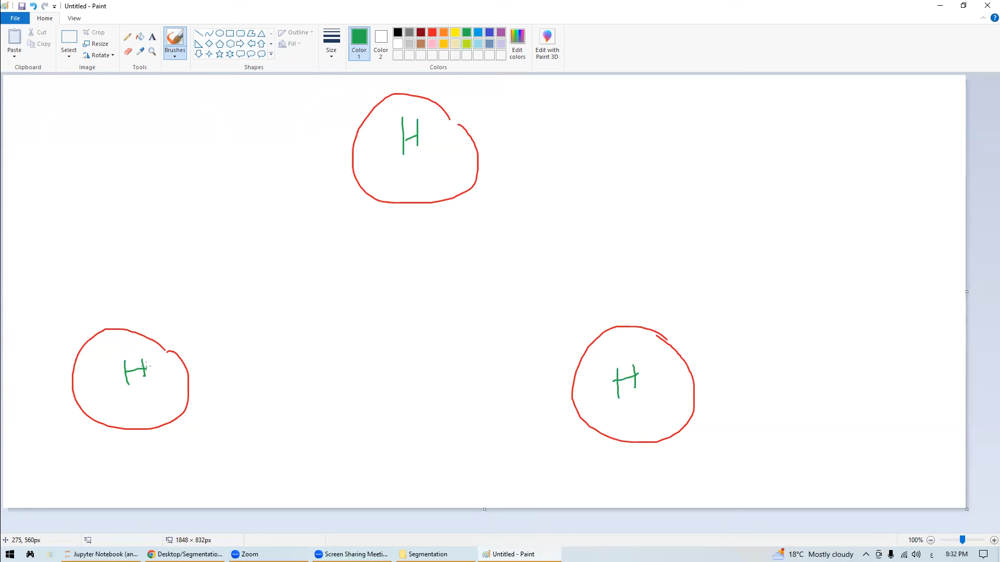

    WCV VS BCV: the goal is to minimize  WCV and Maximize BCV
    ![image-23.png](attachment:image-23.png)

    2- DBI


##### Determination of number of clusters
max number of cluster = number of points. and for this case SSD will be 0 where every point represents as center for itself
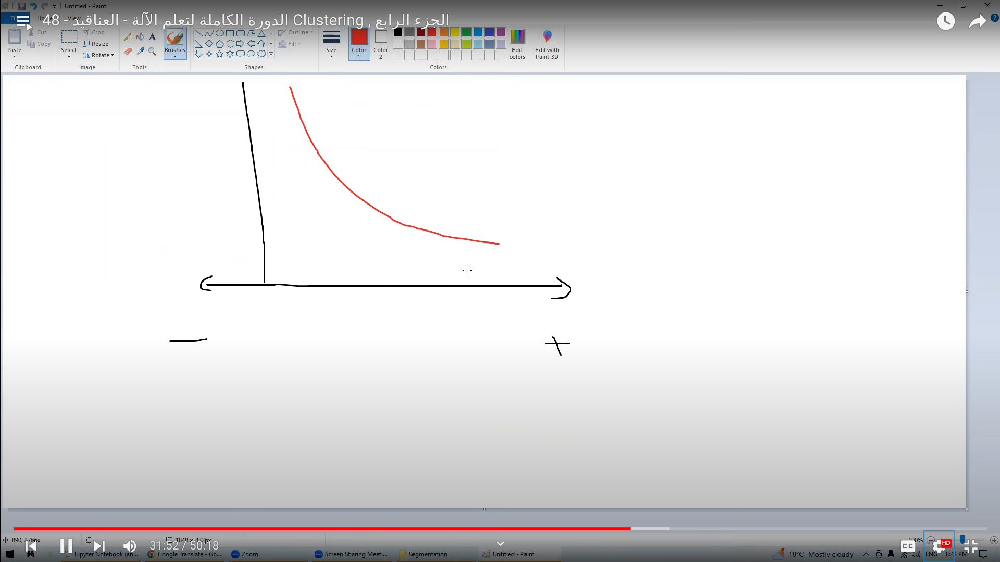
but increasing number of clusters is an obstacles whereas will not be able to get info for the segmant

the right method for determing the number of cluster is to suppose for example 10 cluster and represent the ssd for every number then select the number of cluster the elbow
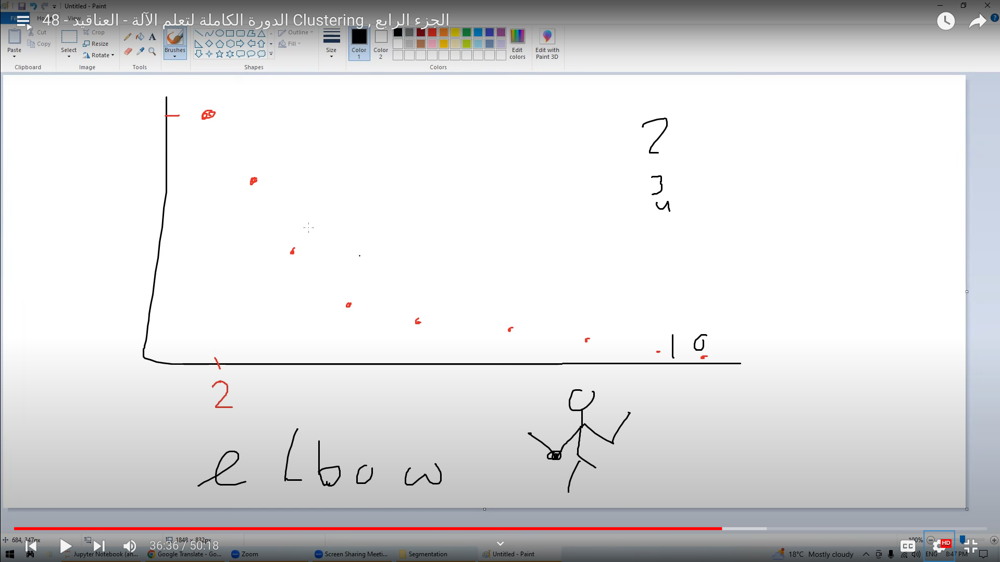
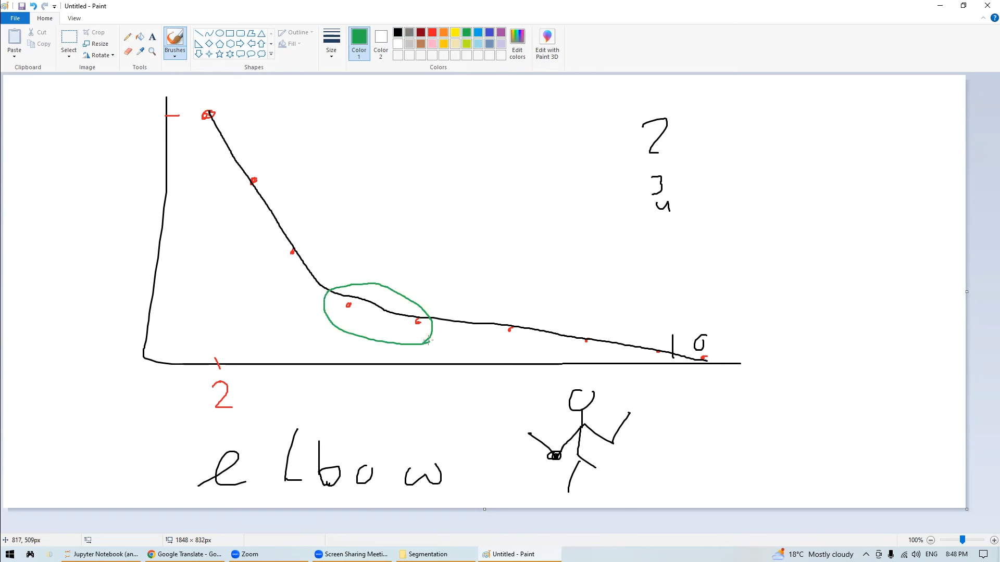
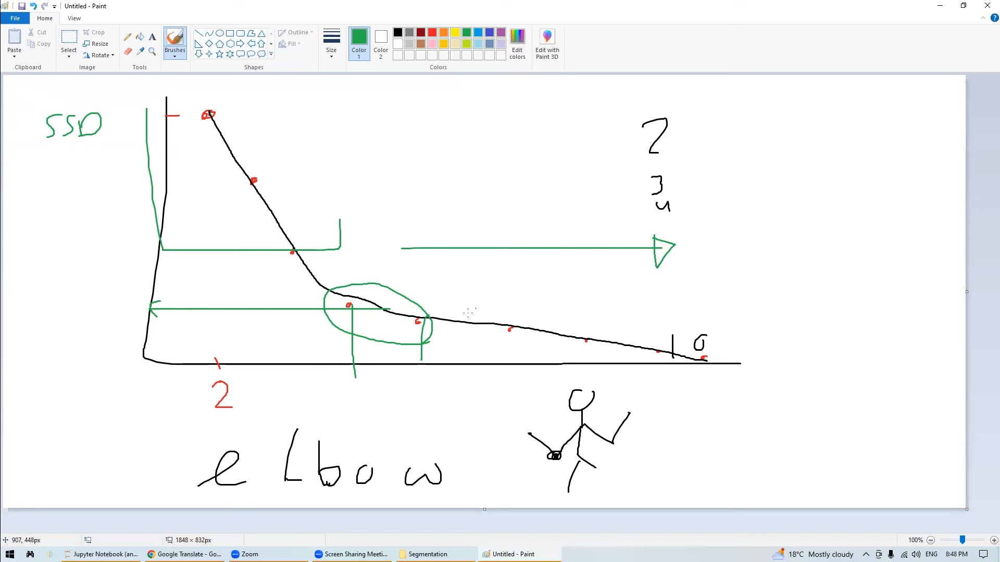
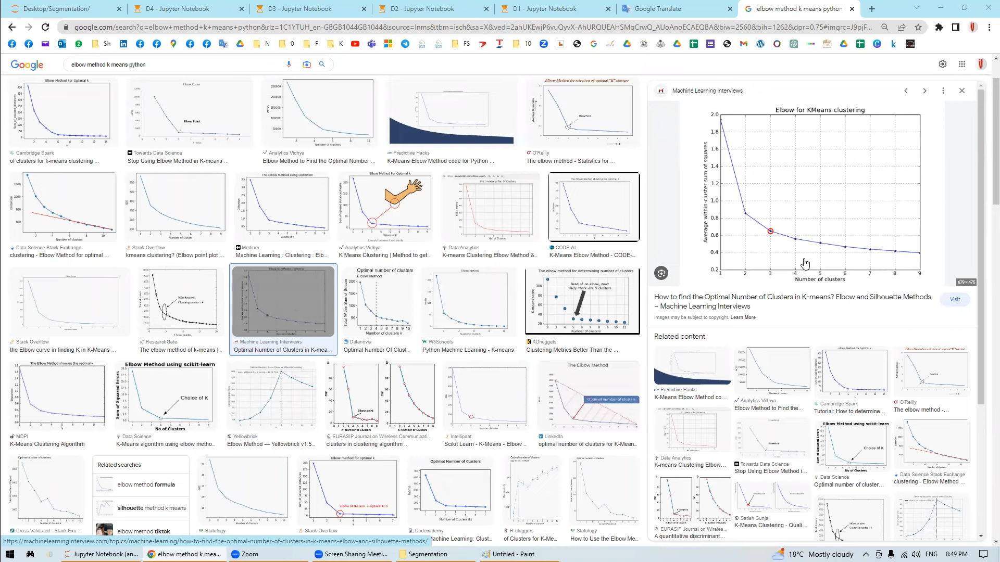

In [122]:
import pandas as pd 

data = pd.read_csv('bank.csv', delimiter=';')  # or '\t' for tab 

# the delimater here to can read all the file 

In [123]:
data.shape

(41188, 21)

In [124]:
data

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


In [125]:
data.isna().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

In [126]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [127]:
data.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [128]:
thesecolumns = (['job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'poutcome', 'y'])

data[thesecolumns]

# all the columns which is categorical and i need to convert it to numerical values

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,y
0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,nonexistent,no
1,services,married,high.school,unknown,no,no,telephone,may,mon,nonexistent,no
2,services,married,high.school,no,yes,no,telephone,may,mon,nonexistent,no
3,admin.,married,basic.6y,no,no,no,telephone,may,mon,nonexistent,no
4,services,married,high.school,no,no,yes,telephone,may,mon,nonexistent,no
...,...,...,...,...,...,...,...,...,...,...,...
41183,retired,married,professional.course,no,yes,no,cellular,nov,fri,nonexistent,yes
41184,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,nonexistent,no
41185,retired,married,university.degree,no,yes,no,cellular,nov,fri,nonexistent,no
41186,technician,married,professional.course,no,no,no,cellular,nov,fri,nonexistent,yes


In [129]:
for i in thesecolumns :
    Dict = {i:j for i,j in zip(data[i].unique(),range(data[i].nunique()))}
    data[f'Enc_{i}']=data[i].map(Dict)
    data.drop([i],axis=1,inplace=True)

In [130]:
data

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,Enc_marital,Enc_education,Enc_default,Enc_housing,Enc_loan,Enc_contact,Enc_month,Enc_day_of_week,Enc_poutcome,Enc_y
0,56,261,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,0,0,0,0,0,0,0,0,0
1,57,149,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,1,0,0,0,0,0,0,0
2,37,226,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,1,0,0,0,0,0,0
3,40,151,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,2,0,0,0,0,0,0,0,0
4,56,307,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,334,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,4,0,1,0,1,5,4,0,1
41184,46,383,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,4,0,0,0,1,5,4,0,0
41185,56,189,2,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,6,0,1,0,1,5,4,0,0
41186,44,442,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,4,0,0,0,1,5,4,0,1


In [132]:
# Import Libraries
from sklearn.cluster import KMeans
#----------------------------------------------------

#----------------------------------------------------


In [133]:

#create obj
KMeansModel = KMeans(n_clusters=5,init='k-means++', #also can be random
                     random_state=33,algorithm= 'auto') # also can be full or elkan



In [134]:
# training
# here USML so we do not have Y 
KMeansModel.fit(data)

KMeans(n_clusters=5, random_state=33)

In [ ]:
#Calculating Details or results
# there are 3 important factors "cluster_centers_, labels_, inertia_"



print('KMeansModel centers are : ' , KMeansModel.cluster_centers_)
print('KMeansModel labels are : ' , KMeansModel.labels_)
print('KMeansModel intertia is : ' , KMeansModel.inertia_)




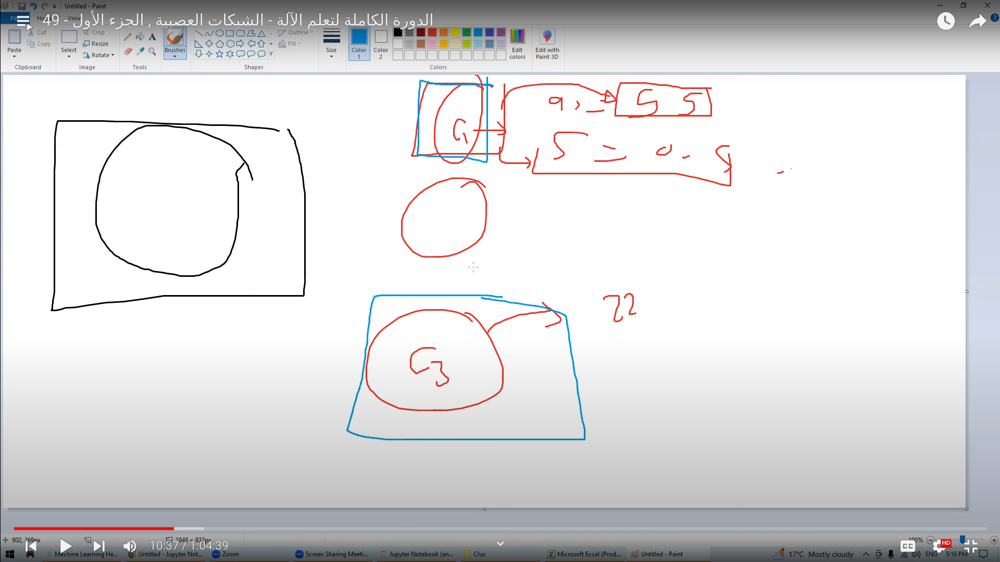

In [135]:
pd.DataFrame(KMeansModel.cluster_centers_)

# number of rows is number of clusters 
# index 0 have 21 columns avery column is the center of every X for one group

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,39.952220,118.726965,2.756904,999.000000,0.112749,0.237625,93.589672,-40.526171,3.810360,5176.590057,...,0.505621,3.294990,0.218574,0.574216,0.203381,0.616986,2.167495,1.971365,0.102240,0.024929
1,39.987546,712.602887,2.437305,999.000000,0.102462,0.148684,93.595625,-40.896207,3.687353,5170.911803,...,0.506935,3.214265,0.211152,0.553071,0.186810,0.659779,2.277385,2.031135,0.090292,0.390603
2,41.873502,309.368842,1.821571,5.996671,1.663782,-2.096538,93.342629,-38.338282,0.986428,5029.293076,...,0.573236,3.665779,0.039947,0.595206,0.198402,0.928096,3.917443,1.939414,1.906125,0.637816
3,39.971220,336.633244,2.282077,999.000000,0.130339,0.001550,93.567519,-40.608920,3.528272,5162.850023,...,0.514251,3.210128,0.210313,0.570704,0.193986,0.624481,2.189097,1.977493,0.112628,0.114381
4,39.614173,1432.751969,2.604987,982.094488,0.107612,0.191470,93.607064,-40.671785,3.740640,5172.312992,...,0.514436,3.202100,0.198163,0.556430,0.228346,0.658793,2.366142,2.114173,0.111549,0.590551


In [136]:
pd.DataFrame(KMeansModel.cluster_centers_, columns= data.columns)


,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,Enc_marital,Enc_education,Enc_default,Enc_housing,Enc_loan,Enc_contact,Enc_month,Enc_day_of_week,Enc_poutcome,Enc_y
0,39.952220,118.726965,2.756904,999.000000,0.112749,0.237625,93.589672,-40.526171,3.810360,5176.590057,...,0.505621,3.294990,0.218574,0.574216,0.203381,0.616986,2.167495,1.971365,0.102240,0.024929
1,39.987546,712.602887,2.437305,999.000000,0.102462,0.148684,93.595625,-40.896207,3.687353,5170.911803,...,0.506935,3.214265,0.211152,0.553071,0.186810,0.659779,2.277385,2.031135,0.090292,0.390603
2,41.873502,309.368842,1.821571,5.996671,1.663782,-2.096538,93.342629,-38.338282,0.986428,5029.293076,...,0.573236,3.665779,0.039947,0.595206,0.198402,0.928096,3.917443,1.939414,1.906125,0.637816
3,39.971220,336.633244,2.282077,999.000000,0.130339,0.001550,93.567519,-40.608920,3.528272,5162.850023,...,0.514251,3.210128,0.210313,0.570704,0.193986,0.624481,2.189097,1.977493,0.112628,0.114381
4,39.614173,1432.751969,2.604987,982.094488,0.107612,0.191470,93.607064,-40.671785,3.740640,5172.312992,...,0.514436,3.202100,0.198163,0.556430,0.228346,0.658793,2.366142,2.114173,0.111549,0.590551


In [137]:
pd.DataFrame(KMeansModel.cluster_centers_, columns= data.columns, index= ['ClusterA','ClusterB','ClusterC','ClusterD','ClusterE'])


,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,Enc_marital,Enc_education,Enc_default,Enc_housing,Enc_loan,Enc_contact,Enc_month,Enc_day_of_week,Enc_poutcome,Enc_y
ClusterA,39.952220,118.726965,2.756904,999.000000,0.112749,0.237625,93.589672,-40.526171,3.810360,5176.590057,...,0.505621,3.294990,0.218574,0.574216,0.203381,0.616986,2.167495,1.971365,0.102240,0.024929
ClusterB,39.987546,712.602887,2.437305,999.000000,0.102462,0.148684,93.595625,-40.896207,3.687353,5170.911803,...,0.506935,3.214265,0.211152,0.553071,0.186810,0.659779,2.277385,2.031135,0.090292,0.390603
ClusterC,41.873502,309.368842,1.821571,5.996671,1.663782,-2.096538,93.342629,-38.338282,0.986428,5029.293076,...,0.573236,3.665779,0.039947,0.595206,0.198402,0.928096,3.917443,1.939414,1.906125,0.637816
ClusterD,39.971220,336.633244,2.282077,999.000000,0.130339,0.001550,93.567519,-40.608920,3.528272,5162.850023,...,0.514251,3.210128,0.210313,0.570704,0.193986,0.624481,2.189097,1.977493,0.112628,0.114381
ClusterE,39.614173,1432.751969,2.604987,982.094488,0.107612,0.191470,93.607064,-40.671785,3.740640,5172.312992,...,0.514436,3.202100,0.198163,0.556430,0.228346,0.658793,2.366142,2.114173,0.111549,0.590551


## Notaions
    1- at age we notice that the valuseis near to each other so Kmeans neglected the age and gives the interest to anothes features like "emp.var.rate	"
    

In [138]:
print('KMeansModel labels are : ' , KMeansModel.labels_)



KMeansModel labels are :  [3 0 0 ... 0 3 3]


In [139]:
len(KMeansModel.labels_)


41188

    2- we have 5 clusters but what is number of rows for every cluster

In [140]:
pd.Series(KMeansModel.labels_).value_counts()

0    24550
3    10841
1     3532
2     1502
4      763
dtype: int64

    3- we notice that cluster0 have the most of rows

    4- inertia : is similar to MSE so to select the best inertia we must follow the next steps:

In [141]:
print('KMeansModel intertia is : ' , KMeansModel.inertia_)


KMeansModel intertia is :  643187364.8970106


In [142]:
from tqdm import tqdm

InertiaDict = {}

# clusters from 2 to 15
for i in range(2,16) :
    KMeansModel = KMeans(n_clusters=i, init= 'k-means++', random_state= 33, algorithm='auto')
    KMeansModel.fit(data)
    InertiaDict[i] = KMeansModel.inertia_

InertiaDict



{2: 2736050548.8034163,
 3: 1321618721.4065895,
 4: 851640625.4077609,
 5: 643187364.8970106,
 6: 532028622.3714329,
 7: 440889318.6829527,
 8: 377539644.148139,
 9: 327103191.5489193,
 10: 285480491.88702124,
 11: 247228764.61388594,
 12: 218601435.1955397,
 13: 199150270.52088597,
 14: 182271342.53947902,
 15: 168985573.04404986}

    5- the first time have 2 cluster and the inertia is 2 bilion
    6- the second time have 3 cluster and the inertia is 1 billion
    7- so when increase the number of clusters the inertia decreased 

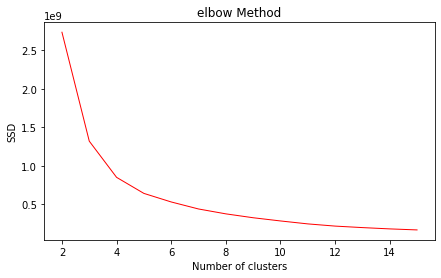

In [143]:
#Import Libraries
import matplotlib.pyplot as plt
#----------------------------------------------------

#----------------------------------------------------
# Adjusting Figure Size . .  :  
plt.figure(figsize = (7, 4))
plt.title('elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('SSD') #inertia
#----------------------------------------------------
#Defining Data
XGraph = InertiaDict.keys()

yGraph = InertiaDict.values()

#----------------------------------------------------
# Drawing plot graph No 1 . .  :   
plt.plot(XGraph,yGraph,linewidth=1,color= 'r', # can be : b ,g ,y ,c ,m ,k ,w 
         alpha=1,linestyle = 'solid') # can be  : dotted, dashed , dashdot




plt.show()

### 3- Semi SML

- when we have unlabeled data but will convert for example 2% from this data to labeled